# Comparison of Modern Convolution and Transformer Architectures: YOLO and RT-DETR in Pothole Detection




## Environment Setup

### Colab / package setup

Mounted the Google Drive so the notebook can access datasets, model weights, and output directories stored under the Drive path.





In [ ]:
#!/usr/bin/env python3

from google.colab import drive
drive.mount('/content/drive')

!pip install -q ultralytics torch torchvision torchaudio opencv-python numpy matplotlib pyyaml pillow scikit-learn pandas

Mounted at /content/drive
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 16.4 MB/s eta 0:00:00


Following are the dependencies for this project:

* ultralytics for YOLOv8 and RT-DETR training/validation/inference

* torch, torchvision, torchaudio for the PyTorch backend

* opencv-python for image and video I/O + basic CV operations

* numpy for numerical operations and array manipulation

* matplotlib for plotting learning curves and visualizations

* pyyaml for reading/writing YOLO-style data.yaml configs

* pillow for general image loading and processing

* scikit-learn for confusion matrices, metrics, and simple evaluation utilities

* pandas for handling training logs (results.csv) and tabular summaries



### Imports packages

In [ ]:
import os
import sys
import random
import shutil
import time
from pathlib import Path
from typing import Union, List, Dict

import numpy as np
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from IPython.display import display

import torch

# Disable strict deterministic algorithms to avoid grid_sampler warnings
# and use standard fast kernels
torch.use_deterministic_algorithms(False)

if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True
    torch.backends.cudnn.deterministic = False

from ultralytics import YOLO, RTDETR

plt.rcParams["figure.figsize"] = (6, 6)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


### Configuration parameters

In [ ]:
# Root folder of your YOLO pothole SEGMENTATION dataset
DATA_ROOT = Path("/content/drive/MyDrive/Pothole/dataset")

# Use existing data.yaml inside segmentation dataset (or auto-create)
DATA_CONFIG_PATH = DATA_ROOT / "data.yaml"

# Directory where YOLO will place training runs
RUNS_DIRECTORY = DATA_ROOT / "pothole_runs"

# Segmentation model (for masks)
BASE_MODEL_WEIGHTS = "yolov8l-seg.pt"

# RT-DETR detection weights (object detection only)
RTDETR_WEIGHTS = "rtdetr-l.pt"

# Detection clone of the dataset (we generate this from polygons)
DET_DATA_ROOT = DATA_ROOT.parent / "pothole_det_dataset"
DET_DATA_CONFIG_PATH = DET_DATA_ROOT / "data_det.yaml"

# Class list
CLASS_LABELS = ["pothole"]

# Optional input video path for best-model demo
VIDEO_INPUT_PATH = "/content/drive/MyDrive/Pothole/dataset/sample_video 2.mp4"

# Final long-run training config for YOLO (with early stopping)
FINAL_YOLO_EPOCHS = 100
FINAL_YOLO_PATIENCE = 20  # early stopping patience

# Hyperparam constants for all HP_EXPERIMENTS
HP_IMGSZ = 640
HP_EPOCHS = 10  # shorter runs for sweep
HP_LRF = 0.01
HP_OPTIMIZER = "SGD"
HP_MOMENTUM = 0.937
HP_WEIGHT_DECAY = 5e-4
HP_WARMUP_EPOCHS = 3.0
HP_WARMUP_MOMENTUM = 0.8
HP_PATIENCE = 8

## Dataset Prepration

### Dataset cleaning

The following functions below cleans the dataset by scanning all label files and removing any that are not in proper YOLOv8 segmentation format. A label file is marked as invalid if it is empty, if any line has fewer than 7 tokens (1 class id + at least three (x, y) points), if the number of coordinate values is not even (every x must have a matching y), or if the coordinates cannot be parsed as floats normalized to the [0, 1] range. This helps automatically filter out and delete samples that do not comply with the expected annotation requirements.

In [ ]:
SPLITS = ["train", "valid", "test"]

IMG_EXTS = [".jpg", ".jpeg", ".png", ".bmp", ".JPG", ".PNG"]

def find_image_for_label(label_path: Path):
    images_dir = label_path.parent.parent / "images"
    stem = label_path.stem
    for ext in IMG_EXTS:
        img_candidate = images_dir / f"{stem}{ext}"
        if img_candidate.exists():
            return img_candidate
    return None

def is_bad_segmentation_label(label_path: Path):
    text = label_path.read_text().strip()
    if not text:
        return True  # empty file

    for line in text.splitlines():
        parts = line.strip().split()
        if len(parts) < 7:
            return True
        # 1 class_id + 2*k coords (len-1) must be even
        if (len(parts) - 1) % 2 != 0:
            return True

        # check that all coords are floats in [0,1]
        try:
            cls = int(parts[0])
            coords = list(map(float, parts[1:]))
        except ValueError:
            return True

        # rough sanity check for coords
        for c in coords:
            if not (0.0 <= c <= 1.0):
                return True

    return False

def clean_segmentation_dataset(root: Path, dry_run: bool = False):
    bad_labels = []
    for split in SPLITS:
        split_dir = root / split
        labels_dir = split_dir / "labels"
        if not labels_dir.exists():
            continue

        print(f"\nChecking split: {split} ({labels_dir})")
        for lbl in sorted(labels_dir.glob("*.txt")):
            if is_bad_segmentation_label(lbl):
                img = find_image_for_label(lbl)
                bad_labels.append((lbl, img))

    print(f"\nFound {len(bad_labels)} bad label files.")

    # Delete them if not dry_run
    for lbl, img in bad_labels:
        print(f"Removing bad label: {lbl}")
        if not dry_run:
            try:
                lbl.unlink()
            except Exception as e:
                print(f"ould not delete label {lbl}: {e}")

        if img is not None and img.exists():
            print(f"Removing associated image: {img}")
            if not dry_run:
                try:
                    img.unlink()
                except Exception as e:
                    print(f"Could not delete image {img}: {e}")
        else:
            print("No matching image found.")

# First run as dry-run to SEE what will be removed:
#clean_segmentation_dataset(DATA_ROOT, dry_run=True)

# If it looks correct, run again with dry_run=False to actually delete:
#clean_segmentation_dataset(DATASET_ROOT, dry_run=False)


### Spliting the dataset into train, vaid and test dataset

The dataset was assembled from multiple public sources on Kaggle and Hugging Face and initially stored in a single “train” directory, with a small subset already placed in “valid.” To prepare clean splits for model training and evaluation, all images and labels from the original train and valid folders were first pooled into a temporary _all directory. From this combined pool, the script then performed a randomized split into three subsets: 100 images for validation, 100 images for the final test set, and the remaining ~15,000 images for training. The files were physically moved into train/, valid/, and test/ subfolders (each with matching images/ and labels/), ensuring a clear separation between training, validation, and test data for the experiments.

In [ ]:
# Directories
train_img_dir = DATA_ROOT / "train" / "images"
train_lbl_dir = DATA_ROOT / "train" / "labels"
valid_img_dir = DATA_ROOT / "valid" / "images"
valid_lbl_dir = DATA_ROOT / "valid" / "labels"

# Temporary "all" folder to pool everything
all_img_dir = DATA_ROOT / "_all" / "images"
all_lbl_dir = DATA_ROOT / "_all" / "labels"
all_img_dir.mkdir(parents=True, exist_ok=True)
all_lbl_dir.mkdir(parents=True, exist_ok=True)

if list(all_img_dir.glob("*")):
    raise RuntimeError("'_all/images' is not empty. "
                       "It looks like you already ran this split script.")

# 1) Move ALL images+labels from train and valid into _all/
def move_split_to_all(split_name: str):
    src_img_dir = DATA_ROOT / split_name / "images"
    src_lbl_dir = DATA_ROOT / split_name / "labels"

    if not src_img_dir.exists():
        print(f"[WARN] {src_img_dir} does not exist, skipping.")
        return

    img_paths = sorted(list(src_img_dir.glob("*.jpg")) +
                       list(src_img_dir.glob("*.jpeg")) +
                       list(src_img_dir.glob("*.png")))

    print(f"[INFO] Moving {len(img_paths)} images from {split_name}/ to _all/")
    for img_path in img_paths:
        # move image
        dst_img = all_img_dir / img_path.name
        shutil.move(str(img_path), str(dst_img))

        # move label (if exists)
        lbl_path = (src_lbl_dir / img_path.name).with_suffix(".txt")
        if lbl_path.exists():
            dst_lbl = all_lbl_dir / lbl_path.name
            shutil.move(str(lbl_path), str(dst_lbl))

move_split_to_all("train")
move_split_to_all("valid")

# Check total
all_imgs = sorted(list(all_img_dir.glob("*.jpg")) +
                  list(all_img_dir.glob("*.jpeg")) +
                  list(all_img_dir.glob("*.png")))
print(f"[INFO] Total images pooled in _all: {len(all_imgs)}")

# 2) Shuffle and split: 100 valid, 100 test, rest train
random.seed(42)
random.shuffle(all_imgs)

n_valid = 100
n_test = 100

valid_imgs = set(all_imgs[:n_valid])
test_imgs  = set(all_imgs[n_valid:n_valid+n_test])
train_imgs = set(all_imgs[n_valid+n_test:])

print(f"[INFO] New split sizes -> train: {len(train_imgs)}, "
      f"valid: {len(valid_imgs)}, test: {len(test_imgs)}")

# 3) Prepare final directories
new_train_img_dir = DATA_ROOT / "train" / "images"
new_train_lbl_dir = DATA_ROOT / "train" / "labels"
new_valid_img_dir = DATA_ROOT / "valid" / "images"
new_valid_lbl_dir = DATA_ROOT / "valid" / "labels"
test_img_dir      = DATA_ROOT / "test" / "images"
test_lbl_dir      = DATA_ROOT / "test" / "labels"

for d in [new_train_img_dir, new_train_lbl_dir,
          new_valid_img_dir, new_valid_lbl_dir,
          test_img_dir, test_lbl_dir]:
    d.mkdir(parents=True, exist_ok=True)

def move_set(img_set, dst_img_dir, dst_lbl_dir, split_name):
    count = 0
    for img_path in img_set:
        dst_img = dst_img_dir / img_path.name
        shutil.move(str(img_path), str(dst_img))

        lbl_src = (all_lbl_dir / img_path.name).with_suffix(".txt")
        if lbl_src.exists():
            dst_lbl = dst_lbl_dir / lbl_src.name
            shutil.move(str(lbl_src), str(dst_lbl))
        count += 1
    print(f"[DONE] Moved {count} images to {split_name}/")

#move_set(train_imgs, new_train_img_dir, new_train_lbl_dir, "train")
#move_set(valid_imgs, new_valid_img_dir, new_valid_lbl_dir, "valid")
#move_set(test_imgs,  test_img_dir,      test_lbl_dir,      "test")

print("[CLEANUP] Removing empty _all/ folder")
shutil.rmtree(DATA_ROOT / "_all", ignore_errors=True)

# Final sanity: print counts
def count_imgs(split):
    img_dir = DATA_ROOT / split / "images"
    imgs = list(img_dir.glob("*.jpg")) + list(img_dir.glob("*.jpeg")) + list(img_dir.glob("*.png"))
    return len(imgs)

print("\n[FINAL COUNTS]")
print("Train:", count_imgs("train"))
print("Valid:", count_imgs("valid"))
print("Test :", count_imgs("test"))




[FINAL COUNTS]
Train: 1576
Valid: 100
Test : 100


### Dataset helper functions

This group of utility functions is responsible for validating the dataset layout, wiring it into Ultralytics, and creating a detection-only clone from the segmentation labels so both YOLOv8-Seg and RT-DETR can be trained consistently.

* `verify_dataset_layout()` checks that the dataset root follows the expected YOLO folder convention with three splits (`train`, `valid`, `test`), each containing both `images/` and `labels/`. If any of these directories is missing, it raises an error early so training does not silently run on a broken or partial dataset.

* `create_data_yaml()` creates (once) the `data.yaml` file that Ultralytics expects. It wires in the root path, and explicitly points `train`, `val`, and `test` to their respective `images/` directories, and records the number of classes and their names. If a valid YAML already exists, it is reused instead of overwritten.

* `ensure_directory()` is a small helper that guarantees a directory exists (creating parents as needed). It is used throughout the pipeline before writing images, labels, or cloned datasets.

* `list_images_labels()` returns a sorted list of image files and corresponding label files for a given split directory. It looks under `images/` for common image extensions and under `labels/` for `.txt` files, making it easy to compute statistics or iterate over a split in a consistent way.

* `yolo_seg_polygons()` parses a YOLOv8 segmentation label file (`class_id x1 y1 x2 y2 ...`) and converts normalized polygon coordinates into absolute pixel coordinates given the image width and height. The function returns a list of `(class_id, polygon_points)` tuples and is reused for visualization and mask generation.

* `convert_seg_label_to_det()` transforms a YOLO segmentation label into a detection (bounding-box) label. For each polygon, it computes the tight axis-aligned bounding box, converts it back to normalized YOLO `(cx, cy, w, h)` format, and writes it to the destination label file. This is the critical bridge that lets us reuse the same annotated data for RT-DETR, which only needs boxes, not full masks.

* `clone_seg_to_det_dataset()` builds a **detection-only clone** of the segmentation dataset under a separate root (e.g., `pothole_det_dataset`). It iterates over the `train`, `valid`, and `test` splits, copies all images, and converts each segmentation label to a detection label using `convert_seg_label_to_det()`. On subsequent runs it performs a quick sanity check (expected folders exist and contain images) and skips the clone unless `overwrite=True` is explicitly requested. This gives us two parallel datasets—one for segmentation and one for detection—while keeping the splits perfectly aligned.


In [ ]:
def verify_dataset_layout(dataset_root: Path) -> None:
    """
    Check that train, valid and test splits exist with images and labels.
    """
    expected_rel_paths = [
        "train/images",
        "valid/images",
        "test/images",
        "train/labels",
        "valid/labels",
        "test/labels",
    ]
    for rel in expected_rel_paths:
        full_path = dataset_root / rel
        if not full_path.exists():
            raise FileNotFoundError(
                f"Expected directory not found: {full_path}\n"
                "Expected:\n"
                "  train/images, valid/images, test/images\n"
                "  train/labels, valid/labels, test/labels\n"
            )
    print(f"[OK] Dataset structure validated at: {dataset_root}")


def create_data_yaml(yaml_path: Path, dataset_root: Path, class_names: list) -> None:
    """
    Create a data.yaml that includes train, val and test splits
    (if not already present).
    """
    if yaml_path.exists():
        print(f"[OK] Using existing data.yaml at: {yaml_path}")
        return

    yaml_text = f"""# Auto-generated data config for pothole detection
                path: {dataset_root}
                train: train/images
                val: valid/images
                test: test/images

                nc: {len(class_names)}
                names: {class_names}
                """
    yaml_path.write_text(yaml_text)
    print(f"[OK] Data configuration YAML written to: {yaml_path}")


def ensure_directory(path: Path) -> None:
    path.mkdir(parents=True, exist_ok=True)


def list_images_labels(split_dir: Path):
    img_dir = split_dir / "images"
    lbl_dir = split_dir / "labels"
    image_files = sorted(
        list(img_dir.glob("*.jpg")) +
        list(img_dir.glob("*.jpeg")) +
        list(img_dir.glob("*.png"))
    )
    label_files = sorted(list(lbl_dir.glob("*.txt")))
    return image_files, label_files


def yolo_seg_polygons(label_path: Path, img_w: int, img_h: int):
    polys = []
    if not label_path.exists():
        return polys

    with open(label_path, "r") as f:
        for line in f:
            parts = list(map(float, line.strip().split()))
            if not parts:
                continue
            cls_id = int(parts[0])
            coords = parts[1:]
            xs = coords[0::2]
            ys = coords[1::2]
            pts = [(x * img_w, y * img_h) for x, y in zip(xs, ys)]
            polys.append((cls_id, pts))
    return polys

def convert_seg_label_to_det(src_label_path: Path, dst_label_path: Path) -> None:
    """
    Convert YOLO seg label to YOLO det label: polygon -> tight bounding box.
    """
    if not src_label_path.exists():
        return

    lines_out = []
    with open(src_label_path, "r") as f:
        for line in f:
            parts = list(map(float, line.strip().split()))
            if not parts:
                continue
            cls_id = int(parts[0])
            coords = parts[1:]
            xs = coords[0::2]
            ys = coords[1::2]
            if not xs or not ys:
                continue
            xmin, xmax = min(xs), max(xs)
            ymin, ymax = min(ys), max(ys)
            cx = (xmin + xmax) / 2.0
            cy = (ymin + ymax) / 2.0
            w = (xmax - xmin)
            h = (ymax - ymin)
            if w <= 0 or h <= 0:
                continue
            lines_out.append(f"{cls_id} {cx:.6f} {cy:.6f} {w:.6f} {h:.6f}\n")

    if lines_out:
        with open(dst_label_path, "w") as f_out:
            f_out.writelines(lines_out)


def clone_seg_to_det_dataset(seg_root: Path, det_root: Path, overwrite: bool = False) -> None:
    """
    Create detection-only clone of the segmentation dataset.

    Now clones train, valid and test splits.
    """
    required_dirs = [
        det_root / "train/images",
        det_root / "train/labels",
        det_root / "valid/images",
        det_root / "valid/labels",
        det_root / "test/images",
        det_root / "test/labels",
    ]

    if det_root.exists() and not overwrite:
        # Quick sanity check: do we have the expected folders and at least 1 image?
        has_all_dirs = all(d.exists() for d in required_dirs)
        has_any_image = False
        if has_all_dirs:
            img_files = list((det_root / "train/images").glob("*.jpg")) + \
                        list((det_root / "train/images").glob("*.jpeg")) + \
                        list((det_root / "train/images").glob("*.png"))
            if len(img_files) > 0:
                has_any_image = True

        if has_all_dirs and has_any_image:
            print(f"[INFO] Detection dataset already exists at {det_root}, skipping clone.")
            return
        else:
            print(f"[WARN] Existing detection dataset at {det_root} seems incomplete.")
            print("       Rebuilding detection clone from segmentation dataset...")

    if det_root.exists() and overwrite:
        print(f"[INFO] Overwrite=True: removing existing detection dataset at {det_root}")
        shutil.rmtree(det_root, ignore_errors=True)

    print(f"\n[INFO] Creating detection clone of dataset at: {det_root}")
    splits = ["train", "valid", "test"]
    for split in splits:
        src_img_dir = seg_root / split / "images"
        src_lbl_dir = seg_root / split / "labels"

        dst_img_dir = det_root / split / "images"
        dst_lbl_dir = det_root / split / "labels"

        ensure_directory(dst_img_dir)
        ensure_directory(dst_lbl_dir)

        img_files = sorted(
            list(src_img_dir.glob("*.jpg")) +
            list(src_img_dir.glob("*.jpeg")) +
            list(src_img_dir.glob("*.png"))
        )

        for img_path in img_files:
            dst_img_path = dst_img_dir / img_path.name
            if not dst_img_path.exists():
                shutil.copy2(img_path, dst_img_path)

            src_label_path = (src_lbl_dir / img_path.name).with_suffix(".txt")
            dst_label_path = (dst_lbl_dir / img_path.name).with_suffix(".txt")
            convert_seg_label_to_det(src_label_path, dst_label_path)

    print("[OK] Detection dataset clone created.")

###  Cloning dataset for RT-DETR

In [ ]:
clone_seg_to_det_dataset(DATA_ROOT, DET_DATA_ROOT, overwrite=False)
create_data_yaml(DET_DATA_CONFIG_PATH, DET_DATA_ROOT, CLASS_LABELS)

[INFO] Detection dataset already exists at /content/drive/MyDrive/Pothole/pothole_det_dataset, skipping clone.
[OK] Using existing data.yaml at: /content/drive/MyDrive/Pothole/pothole_det_dataset/data_det.yaml


## Exploratory Data Analysis

These helper functions support the exploratory data analysis (EDA) of the pothole dataset.
`summarize_dataset()` prints a high-level summary for each split (train, validation, and test), including the number of images and labels, as well as approximate width/height ranges based on a random subset of samples. This is useful to quickly verify dataset size, class coverage, and whether image resolutions are reasonably consistent.

`show_training_samples()` provides a qualitative view of the training data by randomly selecting a configurable number of images, overlaying the YOLOv8 segmentation polygons on top of each image, and displaying them in a grid layout. This visualization helps confirm that annotations are correctly aligned with potholes and that the masks look reasonable before committing to full model training.

In [ ]:
def summarize_dataset(dataset_root: Path):
    print("\nDATASET SUMMARY")
    for split_name, folder_name in [
        ("Train", "train"),
        ("Validation", "valid"),
        ("Test", "test"),
    ]:
        split_dir = dataset_root / folder_name
        imgs, lbls = list_images_labels(split_dir)
        print(f"\n[{split_name}]")
        print(f"  # Images : {len(imgs)}")
        print(f"  # Labels : {len(lbls)}")

        if imgs:
            sample_imgs = imgs if len(imgs) < 20 else random.sample(imgs, 20)
            whs = []
            for p in sample_imgs:
                img = cv2.imread(str(p))
                if img is None:
                    continue
                h, w = img.shape[:2]
                whs.append((w, h))
            if whs:
                ws, hs = zip(*whs)
                print(f"  Width range  : {min(ws)} - {max(ws)}")
                print(f"  Height range : {min(hs)} - {max(hs)}")

    print("\nClasses:", CLASS_LABELS)


def show_training_samples(dataset_root: Path, num_samples: int = 4):
    print(f"[INFO] Showing {num_samples} training samples with annotations...")

    train_dir = dataset_root / "train"
    img_files, _ = list_images_labels(train_dir)

    if not img_files:
        print("No training images found.")
        return

    num_samples = min(num_samples, len(img_files))
    sample_paths = random.sample(img_files, num_samples)

    cols = min(5, num_samples)
    rows = int(np.ceil(num_samples / cols))

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))

    axes = np.array(axes).reshape(-1)

    for ax, img_path in zip(axes, sample_paths):
        label_path = (train_dir / "labels" / img_path.name).with_suffix(".txt")
        img = cv2.imread(str(img_path))
        if img is None:
            ax.axis("off")
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        h, w = img_rgb.shape[:2]

        ax.imshow(img_rgb)
        #ax.set_title(img_path.name, fontsize=8)
        ax.axis("off")

        if label_path.exists():
            polys = yolo_seg_polygons(label_path, w, h)
            for cls_id, pts in polys:
                pts_np = np.array(pts)
                ax.fill(
                    pts_np[:, 0], pts_np[:, 1],
                    alpha=0.3,
                    edgecolor="red",
                    linewidth=2
                )
                x0, y0 = pts[0]
                ax.text(
                    x0, y0 - 5,
                    CLASS_LABELS[cls_id],
                    color="yellow",
                    fontsize=7,
                    bbox=dict(facecolor="black", alpha=0.5, pad=1),
                )

    # Turn off any unused axes
    for ax in axes[len(sample_paths):]:
        ax.axis("off")

    # Add spacing between subplots so images are not stuck together
    plt.subplots_adjust(wspace=0.3, hspace=0.4)
    plt.show()


### Validate dataset

In [ ]:
# Dataset checks & basic stats (segmentation dataset)
verify_dataset_layout(DATA_ROOT)
create_data_yaml(DATA_CONFIG_PATH, DATA_ROOT, CLASS_LABELS)

[OK] Dataset structure validated at: /content/drive/MyDrive/Pothole/dataset
[OK] Using existing data.yaml at: /content/drive/MyDrive/Pothole/dataset/data.yaml


### Dataset statistics & visualization

In [ ]:
summarize_dataset(DATA_ROOT)


DATASET SUMMARY

[Train]
  # Images : 1576
  # Labels : 1576
  Width range  : 640 - 640
  Height range : 480 - 640

[Validation]
  # Images : 100
  # Labels : 100
  Width range  : 640 - 640
  Height range : 480 - 640

[Test]
  # Images : 100
  # Labels : 100
  Width range  : 640 - 640
  Height range : 480 - 640

Classes: ['pothole']


[INFO] Showing 10 training samples with annotations...


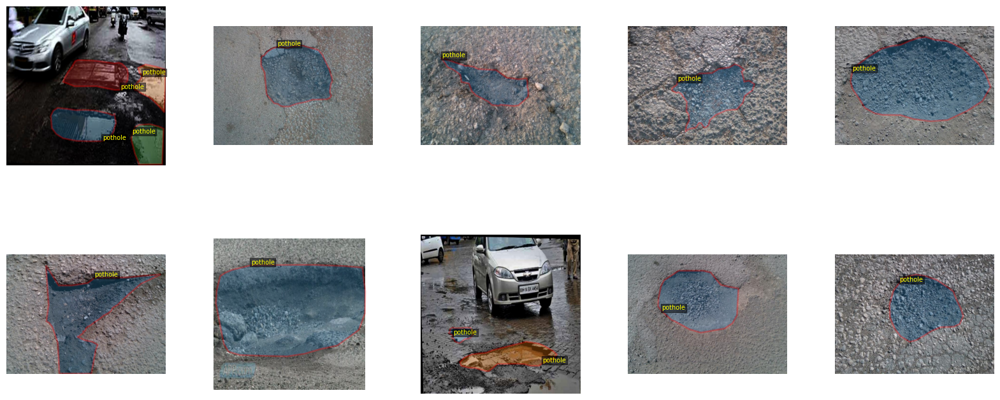

In [ ]:
show_training_samples(DATA_ROOT, num_samples=10)

## Model Training and Experiments

These helper functions are used to evaluate the trained models and visualize how training and hyperparameter choices impact performance.

* `evaluate_model` is a thin wrapper around Ultralytics' `.val()` API. It runs evaluation on a chosen split (validation or test) and prints key detection/segmentation metrics if available: box mAP@0.5, box mAP@0.5:0.95, precision, recall, and mask mAP for segmentation models. The returned `metrics` object is later reused for side-by-side model comparison in the notebook.

* `plot_learning_curves` reads the `results.csv` file produced by Ultralytics for a given training run and plots two panels: (1) training losses over epochs (to confirm that optimization is converging and not diverging), and (2) validation mAP over epochs (to check for saturation, overfitting, or early-stopping behavior). This gives a quick visual story of how the model learned over time.

* `plot_hparam_summary` takes the aggregated hyperparameter sweep results (`results_df`) and produces a simple bar chart of final mAP for each experiment name. This is useful to quickly identify which (batch size, learning rate) combination performed best at the end of the sweep.

* `plot_mAP_curves_for_experiments` goes one level deeper by plotting the validation mAP curve across epochs for each hyperparameter setting on the same figure. Each experiment gets its own color/marker, making it easier to see not just the final mAP, but also which configurations learn faster, are more stable, or plateau early.

* `plot_hparam_grid_visual` visualizes how final mAP changes as a function of the initial learning rate (`lr0`) for each batch size. It groups points by `batch` and plots `lr0` on a log scale, which helps interpret trade-offs between learning rate and batch size and provides a clear, quantitative basis for selecting the “best” configuration reported in the results section.


In [ ]:
def evaluate_model(model, data_cfg: Union[str, Path], device: str = "0", split: str = "valid"):
    """
    Run Ultralytics .val() on a given split ('val' or 'test').
    """
    print(f"[INFO] Running evaluation on split='{split}'...")
    metrics = model.val(data=str(data_cfg), device=device, split=split)

    print("\n[RESULTS] Metrics :")
    try:
        print(f"  Box mAP@0.5:     {metrics.box.map50:.4f}")
        print(f"  Box mAP@0.5:0.95 {metrics.box.map:.4f}")
        print(f"  Box Precision:   {metrics.box.mp:.4f}")
        print(f"  Box Recall:      {metrics.box.mr:.4f}")
    except AttributeError:
        pass

    try:
        print(f"  Mask mAP@0.5:    {metrics.seg.map50:.4f}")
        print(f"  Mask mAP@0.5:0.95{metrics.seg.map:.4f}")
    except AttributeError:
        pass

    return metrics


def plot_learning_curves(run_dir: Path):
    csv_path = run_dir / "results.csv"
    if not csv_path.exists():
        print(f"[WARN] results.csv not found in {run_dir}; skipping learning curve plot.")
        return

    df = pd.read_csv(csv_path)
    print("[INFO] Head of results.csv:")
    display(df.head())

    epoch = df.get("epoch", df.index)

    fig, axes = plt.subplots(1, 2, figsize=(12, 4))

    loss_cols = [c for c in df.columns if "train" in c and "loss" in c]
    if loss_cols:
        for c in loss_cols:
            axes[0].plot(epoch, df[c], label=c)
        axes[0].set_title("Training Losses")
        axes[0].set_xlabel("Epoch")
        axes[0].set_ylabel("Loss")
        axes[0].legend()
    else:
        axes[0].set_visible(False)

    map_cols = [c for c in df.columns if "metrics/mAP50" in c or "metrics/mAP50-95" in c]
    if map_cols:
        for c in map_cols:
            axes[1].plot(epoch, df[c], label=c)
        axes[1].set_title("Validation mAP")
        axes[1].set_xlabel("Epoch")
        axes[1].set_ylabel("mAP")
        axes[1].legend()
    else:
        axes[1].set_visible(False)

    plt.tight_layout()
    plt.show()

def plot_hparam_summary(results_df: pd.DataFrame):
    """
    Simple bar chart: final mAP for each experiment (by name).
    """
    if "final_map" not in results_df.columns:
        print("[WARN] No 'final_map' column; cannot plot summary.")
        return

    plt.figure(figsize=(8, 4))
    x = np.arange(len(results_df))
    plt.bar(x, results_df["final_map"])
    plt.xticks(x, results_df["name"], rotation=45, ha="right")
    plt.ylabel("Final mAP")
    plt.title("Final mAP by Hyperparameter Setting (YOLOv8-seg)")
    plt.tight_layout()
    plt.show()


def plot_mAP_curves_for_experiments(experiments: List[Dict]):
    """
    Overlay validation mAP curves (per epoch) for each  experiment.
    Useful for comparing different hyperparameter settings.
    """
    plt.figure(figsize=(8, 5))

    # Color/marker cycles so curves are visually distinct
    colors = plt.get_cmap("tab10").colors
    markers = ["o", "s", "D", "^", "v", ">", "<", "p", "X", "*"]

    plotted = []
    skipped = []

    for idx, cfg in enumerate(experiments):
        run_name = cfg["name"]
        exp_dir = RUNS_DIRECTORY / run_name
        csv_path = exp_dir / "results.csv"

        if not csv_path.exists():
            print(f"[WARN] No results.csv for {run_name}, skipping.")
            skipped.append(run_name)
            continue

        df = pd.read_csv(csv_path)
        epoch = df.get("epoch", df.index)

        # Prefer mAP50-95, fall back to mAP50
        map_cols = [c for c in df.columns if "metrics/mAP50-95" in c]
        if not map_cols:
            map_cols = [c for c in df.columns if "metrics/mAP50" in c]

        if not map_cols:
            print(f"[WARN] No mAP column found in {csv_path}, skipping curve.")
            skipped.append(run_name)
            continue

        color = colors[idx % len(colors)]
        marker = markers[idx % len(markers)]

        plt.plot(
            epoch,
            df[map_cols[0]],
            label=run_name,
            color=color,
            marker=marker,
            linewidth=2,
        )

        plotted.append(run_name)

    plt.xlabel("Epoch")
    plt.ylabel("mAP")
    plt.title("Validation mAP vs Epoch")
    plt.legend()
    plt.tight_layout()
    plt.show()


def plot_hparam_grid_visual(results_df: pd.DataFrame):
    """
    Visualise how mAP varies with lr0 for each batch size.
    Helpful for drawing conclusions in the report.
    """
    if results_df.empty or "final_map" not in results_df.columns:
        print("[WARN] No data for hparam grid visual.")
        return

    # Sort by batch then lr0 for nicer plotting
    df = results_df.sort_values(by=["batch", "lr0"])

    batches = sorted(df["batch"].unique())
    plt.figure(figsize=(7, 5))

    for b in batches:
        sub = df[df["batch"] == b]
        plt.plot(sub["lr0"], sub["final_map"], marker="o", label=f"batch={b}")

    plt.xscale("log")
    plt.xlabel("Initial learning rate (lr0, log scale)")
    plt.ylabel("Final mAP")
    plt.title("Effect of lr0 and batch size on final mAP (YOLOv8-seg)")
    plt.grid(True, which="both", ls="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Yolo

#### Yolo - Experiement with hyperparameter

This block defines a hyperparameters that is used to systematically experiment with the YOLOv8 model before the final training run. Each entry in `HP_EXPERIMENTS` specifies a combination of batch size (`batch`) and initial learning rate (`lr0`), along with a descriptive `name` that is used as the run identifier in Ultralytics.

The grid sweeps three batch sizes (16, 32, 64) and three learning rates (0.0005, 0.001, 0.002), for a total of nine short training runs. For each configuration, the notebook trains the model for a fixed number of epochs and records the resulting mAP. These results are then compared to identify which (batch, lr0) pair yields the best validation performance, and that best configuration is reused in the final long-run training with early stopping.


In [ ]:
HP_EXPERIMENTS: List[Dict] = [
    # Batch size 16, lr0 sweep
    {
        "name": "exp_bs16_lr5e4",   # 0.0005
        "batch": 16,
        "lr0": 5e-4,
    },
    {
        "name": "exp_bs16_lr1e3",   # 0.001
        "batch": 16,
        "lr0": 1e-3,
    },
    {
        "name": "exp_bs16_lr2e3",   # 0.002
        "batch": 16,
        "lr0": 2e-3,
    },

    # Batch size 32, lr0
    {
        "name": "exp_bs32_lr5e4",
        "batch": 32,
        "lr0": 5e-4,
    },
    {
        "name": "exp_bs32_lr1e3",
        "batch": 32,
        "lr0": 1e-3,
    },
    {
        "name": "exp_bs32_lr2e3",
        "batch": 32,
        "lr0": 2e-3,
    },
    # Batch size 64, lr0
    {
        "name": "exp_bs64_lr5e4",
        "batch": 64,
        "lr0": 5e-4,
    },
    {
        "name": "exp_bs64_lr1e3",
        "batch": 64,
        "lr0": 1e-3,
    },
    {
        "name": "exp_bs64_lr2e3",
        "batch": 64,
        "lr0": 2e-3,
    },



]

This function automates the hyperparameter search loop for YOLOv8.

`run_hyperparam_experiments` takes a list of experiment configs (each specifying a batch size and initial learning rate), trains a separate YOLO model for each configuration, and records the outcome. For every experiment it:

* Builds a `train_kwargs` dictionary that fixes all training settings using the global `HP_*` constants, except for `batch` and `lr0`, which come from the current experiment.
* Instantiates a fresh YOLO model from the same base weights and runs `model.train(...)` with that configuration, timing how long the training takes.
* Reads the generated `results.csv` for that run, extracts the final validation mAP (preferring `metrics/mAP50-95`, falling back to `metrics/mAP50`), and stores it along with the key hyperparameters and training time.

At the end, it aggregates all runs into a single DataFrame, prints a summary table, and returns this DataFrame so that downstream code can select the best-performing configuration for the final long-run training.


In [ ]:
def run_hyperparam_experiments(
    experiments: List[Dict],
    data_cfg: Union[str, Path],
    base_weights: str,
    device: str = "0"
) -> pd.DataFrame:
    """
    Run multiple YOLOv8-seg training jobs with different (batch, lr0).
    All other hyperparameters are fixed from global HP_* constants.
    """
    all_results = []

    for cfg in experiments:
        run_name = cfg["name"]
        batch = int(cfg["batch"])
        lr0 = float(cfg["lr0"])

        print("\n" + "=" * 60)
        print(f"[EXP] Running experiment: {run_name}")
        print("=" * 60)

        train_kwargs = {
            "data": str(data_cfg),
            "device": device,
            "project": str(RUNS_DIRECTORY),
            "name": run_name,
            "imgsz": HP_IMGSZ,
            "epochs": HP_EPOCHS,
            "batch": batch,
            "lr0": lr0,
            "lrf": HP_LRF,
            "optimizer": HP_OPTIMIZER,
            "momentum": HP_MOMENTUM,
            "weight_decay": HP_WEIGHT_DECAY,
            "warmup_epochs": HP_WARMUP_EPOCHS,
            "warmup_momentum": HP_WARMUP_MOMENTUM,
            "patience": HP_PATIENCE,
        }

        for k, v in train_kwargs.items():
            if k in ["data", "device", "project", "name"]:
                continue
            print(f"  {k:15s} = {v}")

        model = YOLO(base_weights)
        t0 = time.time()
        model.train(**train_kwargs)
        t1 = time.time()
        train_time_s = t1 - t0

        exp_dir = RUNS_DIRECTORY / run_name
        csv_path = exp_dir / "results.csv"
        final_map = np.nan

        if csv_path.exists():
            df = pd.read_csv(csv_path)
            map_cols = [c for c in df.columns if "metrics/mAP50-95" in c]
            if not map_cols:
                map_cols = [c for c in df.columns if "metrics/mAP50" in c]
            if map_cols:
                final_map = float(df.iloc[-1][map_cols[0]])

        all_results.append({
            "name": run_name,
            "final_map": final_map,
            "batch": batch,
            "lr0": lr0,
            "imgsz": HP_IMGSZ,
            "epochs": HP_EPOCHS,
            "lrf": HP_LRF,
            "optimizer": HP_OPTIMIZER,
            "weight_decay": HP_WEIGHT_DECAY,
            "train_time_s": train_time_s,
        })

    results_df = pd.DataFrame(all_results)
    print("\n[SUMMARY] Hyperparameter experiments (YOLOv8-seg):")
    display(results_df)
    return results_df

In [ ]:
results_df = run_hyperparam_experiments(
    HP_EXPERIMENTS,
    data_cfg=DATA_CONFIG_PATH,
    base_weights=BASE_MODEL_WEIGHTS,
    device="0"
)


[EXP] Running experiment: exp_bs16_lr5e4
  imgsz           = 640
  epochs          = 10
  batch           = 16
  lr0             = 0.0005
  lrf             = 0.01
  optimizer       = SGD
  momentum        = 0.937
  weight_decay    = 0.0005
  warmup_epochs   = 3.0
  warmup_momentum = 0.8
  patience        = 8
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Pothole/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640

,name,final_map,batch,lr0,imgsz,epochs,lrf,optimizer,weight_decay,train_time_s
0,exp_bs16_lr5e4,0.62564,16,0.0005,640,10,0.01,SGD,0.0005,367.265110
1,exp_bs16_lr1e3,0.67730,16,0.0010,640,10,0.01,SGD,0.0005,260.406976
2,exp_bs16_lr2e3,0.69697,16,0.0020,640,10,0.01,SGD,0.0005,262.564593
3,exp_bs32_lr5e4,0.62912,32,0.0005,640,10,0.01,SGD,0.0005,290.110110
4,exp_bs32_lr1e3,0.67621,32,0.0010,640,10,0.01,SGD,0.0005,242.335448
5,exp_bs32_lr2e3,0.69363,32,0.0020,640,10,0.01,SGD,0.0005,241.412690
6,exp_bs64_lr5e4,0.62263,64,0.0005,640,10,0.01,SGD,0.0005,327.234352
7,exp_bs64_lr1e3,0.65735,64,0.0010,640,10,0.01,SGD,0.0005,239.985661
8,exp_bs64_lr2e3,0.66427,64,0.0020,640,10,0.01,SGD,0.0005,229.440466


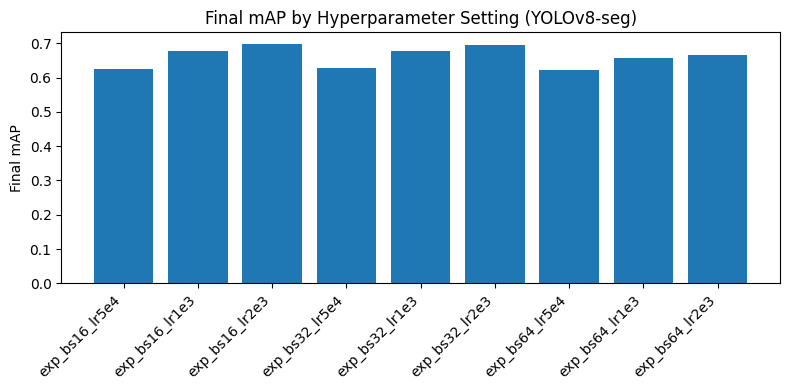

In [ ]:
plot_hparam_summary(results_df)

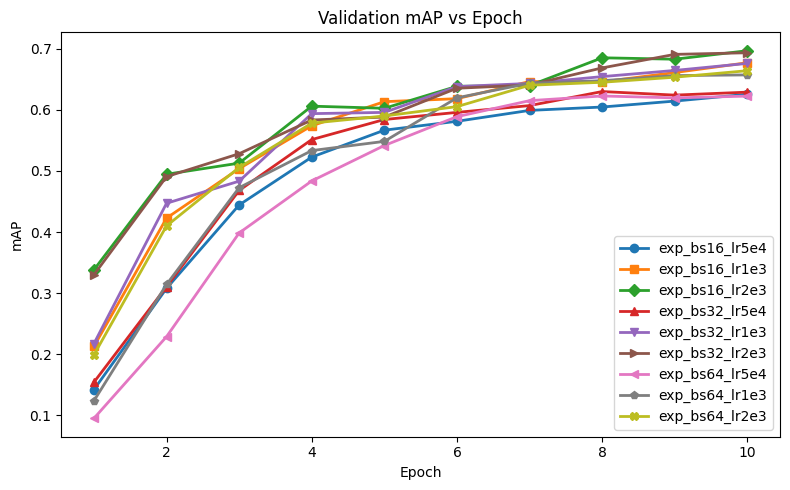

In [ ]:
plot_mAP_curves_for_experiments(HP_EXPERIMENTS)

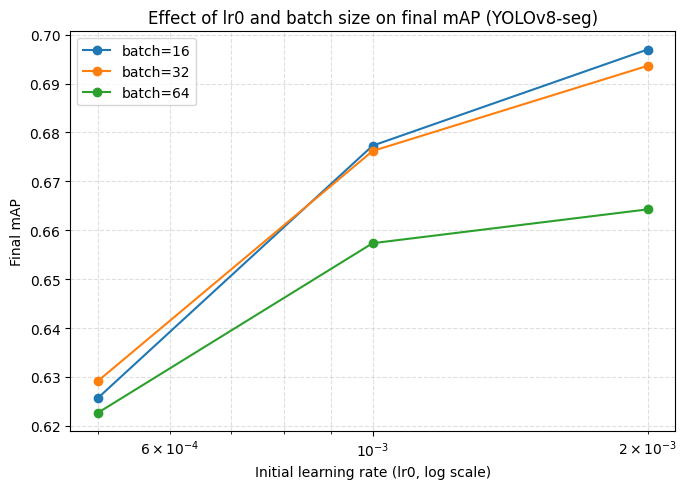

In [ ]:
plot_hparam_grid_visual(results_df)

#### Yolo - Training

The following function performs the **final, high-quality training run** for YOLOv8 using the best hyperparameters discovered during the hyperparameter search.

`train_final_yolo_longrun` takes the winning configuration row (`best_cfg_row`) from the earlier experiments and re-trains the model from the same `base_weights`, but now with:

* **More epochs** (`epochs_long`) to let the model fully converge.
* **Larger early-stopping patience** (`patience_long`) so training does not stop too aggressively.
* The **best batch size and initial learning rate (`lr0`)** read directly from `best_cfg_row`.
* All other training knobs (image size, optimizer, weight decay, momentum, warmup schedule) fixed to the globally defined `HP_*` settings for consistency.

It builds a `train_kwargs` dict, logs the key parameters for traceability, and calls `model.train(...)` while measuring total wall-clock training time. After training finishes, it locates the `best.pt` checkpoint saved by Ultralytics inside the corresponding `runs` directory. If `best.pt` exists, it reloads that checkpoint into `final_model`; otherwise, it falls back to the in-memory model and emits a warning.

The function returns a tuple containing:

1. `final_model` - the best YOLOv8 model from the long-run training,
2. `train_time_s` - total training time in seconds, and
3. `final_run_dir` - the path to the run directory, which is later used for plotting learning curves and documentation.


In [ ]:

def train_final_yolo_longrun(
    base_weights: str,
    data_cfg: Union[str, Path],
    best_cfg_row: pd.Series,
    device: str = "0",
    epochs_long: int = FINAL_YOLO_EPOCHS,
    patience_long: int = FINAL_YOLO_PATIENCE,
) -> tuple[YOLO, float, Path]:
    """
    Re-train YOLOv8-seg using best hyperparameters but with
    more epochs and larger early-stopping patience.
    """
    run_name = str(best_cfg_row["name"]) + "_final_longrun"
    print(f"\n[FINAL YOLO] Training final long-run YOLOv8-seg: {run_name}")

    imgsz = HP_IMGSZ
    lr0 = float(best_cfg_row.get("lr0", 1e-3))
    lrf = HP_LRF
    optimizer = HP_OPTIMIZER
    weight_decay = HP_WEIGHT_DECAY
    momentum = HP_MOMENTUM
    warmup_epochs = HP_WARMUP_EPOCHS
    warmup_momentum = HP_WARMUP_MOMENTUM
    batch = int(best_cfg_row.get("batch", 16))

    train_kwargs = {
        "data": str(data_cfg),
        "imgsz": imgsz,
        "epochs": epochs_long,
        "batch": batch,
        "lr0": lr0,
        "lrf": lrf,
        "optimizer": optimizer,
        "momentum": momentum,
        "weight_decay": weight_decay,
        "warmup_epochs": warmup_epochs,
        "warmup_momentum": warmup_momentum,
        "patience": patience_long,
        "device": device,
        "project": str(RUNS_DIRECTORY),
        "name": run_name,
    }

    for k, v in train_kwargs.items():
        if k in ["data", "device", "project", "name"]:
            continue
        print(f"  {k:15s} = {v}")

    model = YOLO(base_weights)
    t0 = time.time()
    model.train(**train_kwargs)
    t1 = time.time()
    train_time_s = t1 - t0

    final_run_dir = RUNS_DIRECTORY / run_name
    best_weights = final_run_dir / "weights" / "best.pt"
    if not best_weights.exists():
        print("[WARN] Final long-run best.pt not found; using last model in memory.")
        return model, train_time_s, final_run_dir

    final_model = YOLO(str(best_weights))
    print(f"[FINAL YOLO] Training done. Wall time: {train_time_s:.1f} s")
    return final_model, train_time_s, final_run_dir

The following block of code picks the **best hyperparameter experiment** based on validation performance and surfaces it for the final training run.

* First, it check that `results_df` actually contains a `final_map` column and that it is not entirely NaN.
* `idxmax()` is then used on `results_df["final_map"]` to find the row index of the experiment with the highest mAP.
* That row is extracted as `best_row`, which holds the full configuration for the winning experiment (name, batch size, lr0, etc.).
* Finally, it prints the experiment name and uses `display(best_row.to_frame().T)` to show the selected configuration in a compact, one-row DataFrame so it is easy to reference later when calling the final long-run training function.


In [ ]:
# Choose best experiment by final mAP
if "final_map" not in results_df.columns or results_df["final_map"].isna().all():
    print("[WARN] No valid final mAP values; cannot select best YOLO experiment.")
    #return

best_idx = results_df["final_map"].idxmax()
best_row = results_df.loc[best_idx]

print(f"\n[BEST HP] Selected YOLOv8-seg hyperparam experiment: {best_row['name']}")

display(best_row.to_frame().T)


[BEST HP] Selected YOLOv8-seg hyperparam experiment: exp_bs16_lr2e3


,name,final_map,batch,lr0,imgsz,epochs,lrf,optimizer,weight_decay,train_time_s
2,exp_bs16_lr2e3,0.69697,16,0.002,640,10,0.01,SGD,0.0005,262.564593


In [ ]:
# Final YOLO training with early stopping
best_yolo_model, yolo_train_time_s, final_yolo_run_dir = train_final_yolo_longrun(
    base_weights=BASE_MODEL_WEIGHTS,
    data_cfg=DATA_CONFIG_PATH,
    best_cfg_row=best_row,
    device="0",
    epochs_long=FINAL_YOLO_EPOCHS,
    patience_long=FINAL_YOLO_PATIENCE,
)


[FINAL YOLO] Training final long-run YOLOv8-seg: exp_bs16_lr2e3_final_longrun
  imgsz           = 640
  epochs          = 100
  batch           = 16
  lr0             = 0.002
  lrf             = 0.01
  optimizer       = SGD
  momentum        = 0.937
  weight_decay    = 0.0005
  warmup_epochs   = 3.0
  warmup_momentum = 0.8
  patience        = 20
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Pothole/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h

In [ ]:
yolo_val_metrics = evaluate_model(best_yolo_model, DATA_CONFIG_PATH, device="0", split="val")

[INFO] Running evaluation on split='val'...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
YOLOv8l-seg summary (fused): 125 layers, 45,912,659 parameters, 0 gradients, 210.1 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 53.0±25.0 MB/s, size: 64.0 KB)
val: Scanning /content/drive/MyDrive/Pothole/dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 119.7Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.6s/it 25.4s
                   all        100        167      0.963       0.94      0.974      0.795      0.951      0.928      0.964      0.766
Speed: 2.4ms preprocess, 241.7ms inference, 0.0ms loss, 2.0ms postprocess per image
Results saved to /content/runs/segment/val

[RESULTS] Metrics :
  Box mAP@0.5:     0.9735
  Box mAP@0.5:0.95 0.7945
  Box Precision:   0.9630
  Box

[INFO] Head of results.csv:


,epoch,time,train/box_loss,train/seg_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),...,metrics/recall(M),metrics/mAP50(M),metrics/mAP50-95(M),val/box_loss,val/seg_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,25.2994,1.47984,3.36079,2.66072,1.77549,0.53864,0.46707,0.48662,0.29393,...,0.45509,0.49159,0.28640,1.17944,2.20153,1.58387,1.57179,0.067663,0.000660,0.000660
1,2,50.6630,1.18784,2.22778,1.55664,1.48146,0.78051,0.68141,0.79161,0.48893,...,0.67665,0.78160,0.46948,1.07504,1.69572,1.01477,1.42208,0.034984,0.001313,0.001313
2,3,74.7629,1.09534,1.90513,1.16067,1.36326,0.89944,0.68263,0.85678,0.55952,...,0.67066,0.83819,0.54439,0.97067,1.59888,0.77947,1.30284,0.002291,0.001954,0.001954
3,4,98.6545,1.07002,1.80321,0.97676,1.32308,0.79947,0.81167,0.86152,0.57475,...,0.81766,0.87021,0.56989,1.06814,1.52677,0.70227,1.39610,0.001941,0.001941,0.001941
4,5,122.5270,1.05571,1.77851,0.90262,1.30041,0.76958,0.79042,0.86118,0.56430,...,0.80127,0.85869,0.54066,1.01654,1.61627,0.71514,1.30502,0.001921,0.001921,0.001921


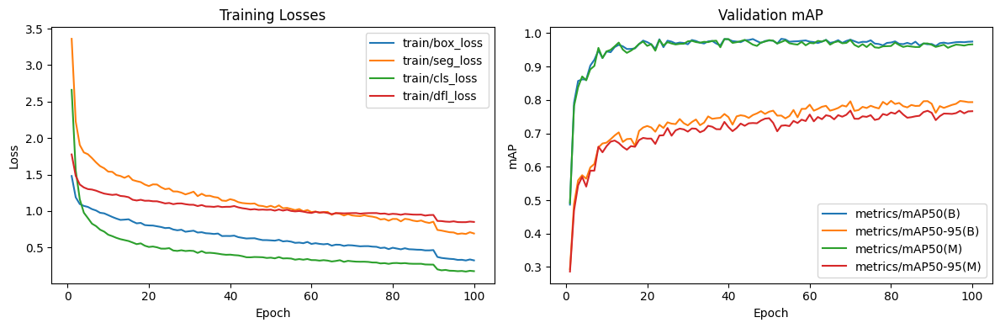

In [ ]:
plot_learning_curves(final_yolo_run_dir)

These inference utilities are used to qualitatively and quantitatively assess how well the trained model generalizes to unseen validation images.

* `show_validation_predictions` randomly samples a few images from the `valid/images` folder and runs `model.predict()` on each of them using the configured confidence and IoU thresholds. It overlays the predicted boxes/masks on the original image (`results[0].plot()`), then displays the annotated samples in a small grid. This gives a quick visual sanity check of whether the model is detecting and segmenting potholes in the right locations and at a reasonable confidence level.

* `build_image_level_confusion_matrix` turns the validation split into a simple **binary classification problem at the image level**:
  - For ground truth (`y_true`), it looks at each label file and sets `gt_has_pothole = 1` if there is at least one annotation line, otherwise `0`.
  - For predictions (`y_pred`), it runs `model.predict()` per image and sets `pred_has_pothole = 1` if any detection boxes are returned, otherwise `0`.

  It then computes a confusion matrix over all validation images (with classes “No pothole” vs. “Pothole”), plots it using `ConfusionMatrixDisplay`, and prints the raw matrix. This provides an intuitive view of how often the model misses pothole images (false negatives) or raises false alarms on clean road images (false positives), complementing the standard mAP metrics.


In [ ]:
def show_validation_predictions(
    model,
    dataset_root: Path,
    num_samples: int = 4,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
):
    val_dir = dataset_root / "valid"
    img_files, _ = list_images_labels(val_dir)
    if not img_files:
        print("No validation images found.")
        return

    num_samples = min(num_samples, len(img_files))
    sample_paths = random.sample(img_files, num_samples)

    cols = 2
    rows = int(np.ceil(num_samples / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = np.array(axes).reshape(-1)

    for ax, img_path in zip(axes, sample_paths):
        results = model.predict(
            source=str(img_path),
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )
        annotated = results[0].plot()
        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        ax.set_title(f"Prediction: {img_path.name}")
        ax.axis("off")

    for ax in axes[len(sample_paths):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()


def build_image_level_confusion_matrix(
    model,
    dataset_root: Path,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    split: str = "valid",   # "valid" or "test"
):
    """
    Build an image-level confusion matrix for a given split.
    Each image is treated as:
      1 = has at least one pothole annotation
      0 = no pothole annotation
    The model prediction is 1 if at least one box is detected.
    """
    print(f"[INFO] Building image-level confusion matrix on '{split}' split...")

    split_dir = dataset_root / split
    img_files, _ = list_images_labels(split_dir)
    if not img_files:
        print(f"No images found in split '{split}'.")
        return

    y_true, y_pred = [], []

    for img_path in img_files:
        label_path = (split_dir / "labels" / img_path.name).with_suffix(".txt")

        gt_has_pothole = 0
        if label_path.exists():
            with open(label_path, "r") as f:
                for line in f:
                    if line.strip():
                        gt_has_pothole = 1
                        break

        # Model prediction
        res = model.predict(
            source=str(img_path),
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )
        boxes = res[0].boxes
        pred_has_pothole = 1 if boxes is not None and len(boxes) > 0 else 0

        y_true.append(gt_has_pothole)
        y_pred.append(pred_has_pothole)

    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    disp = ConfusionMatrixDisplay(cm, display_labels=["No pothole", "Pothole"])
    disp.plot(values_format="d")
    plt.title(f"Image-level Confusion Matrix ({split} split)")
    plt.show()

    print("Confusion matrix (rows=true, cols=pred):")
    print(cm)





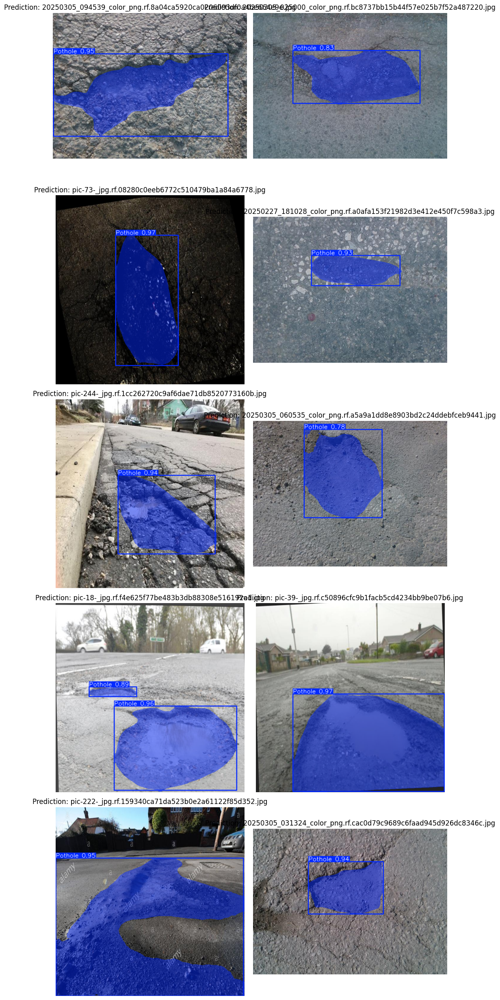

In [ ]:
show_validation_predictions(best_yolo_model, DATA_ROOT, num_samples=10, device="0",
                            conf_thresh=0.4, iou_thresh=0.45)

[INFO] Building image-level confusion matrix on 'valid' split...


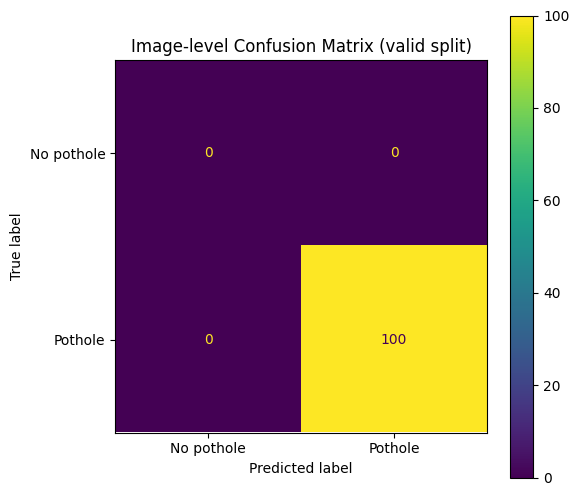

Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]


In [ ]:
build_image_level_confusion_matrix(best_yolo_model, DATA_ROOT, device="0",
                                    conf_thresh=0.4, iou_thresh=0.45, split="valid")

###  RT-DETR

#### RT-DETR Experiments

This block defines the hyperparameter grid used to tune the RT-DETR detector.

For RT-DETR, I vary **batch size** and **initial learning rate (`lr0`)** across a small set of combinations:

* Batch sizes: **16, 32, 64**
* Learning rates: **5e-4, 1e-3, 2e-3**

Each dictionary entry (e.g., `"rtd_bs32_lr1e3"`) represents one experiment, identified by a name that encodes its configuration (`bs32` = batch 32, `lr1e3` = 0.001). During the sweep, the training loop iterates over `RTDETR_EXPERIMENTS`, runs RT-DETR with each (batch, lr0) pair, and logs validation mAP. Later, the best-performing configuration from this grid is selected as the **baseline for the final RT-DETR training run**, similar to how hyperparameters are tuned for the YOLOv8-seg model.


In [ ]:
RTDETR_EXPERIMENTS: List[Dict] = [
    # Batch 16
    {
        "name": "rtd_bs16_lr5e4",
        "batch": 16,
        "lr0": 5e-4,
    },
    {
        "name": "rtd_bs16_lr1e3",
        "batch": 16,
        "lr0": 1e-3,
    },
    {
        "name": "rtd_bs16_lr2e3",
        "batch": 16,
        "lr0": 2e-3,
    },
    # Batch 32
    {
        "name": "rtd_bs32_lr5e4",
        "batch": 32,
        "lr0": 5e-4,
    },
    {
        "name": "rtd_bs32_lr1e3",
        "batch": 32,
        "lr0": 1e-3,
    },
    {
        "name": "rtd_bs32_lr2e3",
        "batch": 32,
        "lr0": 2e-3,
    },
    # Batch 64
    {
        "name": "rtd_bs64_lr5e4",
        "batch": 64,
        "lr0": 5e-4,
    },
    {
        "name": "rtd_bs64_lr1e3",
        "batch": 64,
        "lr0": 1e-3,
    },
    {
        "name": "rtd_bs64_lr2e3",
        "batch": 64,
        "lr0": 2e-3,
    },


]

The `train_rtdetr_model` function is responsible for training **one RT-DETR model** with a specific setup. It takes the dataset configuration, the pretrained RT-DETR weights, and a set of hyperparameters such as image size, number of epochs, batch size, and learning rate. It runs training, measures how long it takes, and then reloads the best checkpoint from disk (if available), returning both the trained model and the run directory.

The `run_rtdetr_hparam_experiments(...)` function goes one level higher: instead of training just one model, it runs **a series of RT-DETR experiments** using different combinations of batch size and learning rate defined in `RTDETR_EXPERIMENTS`. For each configuration, it starts a short training run, reads the `results.csv` file produced by Ultralytics, and pulls out the final detection mAP (using mAP@0.5-0.95 when available, otherwise mAP@0.5). All of these runs are collected into a single DataFrame that records the run name, final mAP, the hyperparameters used, and the training time. This summary table is printed and returned so it can be used later to pick the **best RT-DETR setup** for the final, longer training run.


In [ ]:
def train_rtdetr_model(
    data_cfg: Union[str, Path],
    weights: str,
    run_name: str = "rtdetr_baseline",
    device: str = "0",
    imgsz: int = 640,
    epochs: int = 30,
    batch: int = 8,
    lr0: float = 5e-4,
    amp: bool = False,
) -> tuple[RTDETR, float, Path]:
    """
    Train RT-DETR with safer defaults (lower LR, AMP off by default).
    """
    print(f"\n[RT-DETR] Training RT-DETR model: {run_name}")
    model = RTDETR(weights)
    ensure_directory(RUNS_DIRECTORY)

    t0 = time.time()
    model.train(
        data=str(data_cfg),
        imgsz=imgsz,
        epochs=epochs,
        batch=batch,
        lr0=lr0,
        lrf=HP_LRF,
        device=device,
        amp=amp,
        patience=FINAL_YOLO_PATIENCE,
        project=str(RUNS_DIRECTORY),
        name=run_name,
    )
    t1 = time.time()
    train_time_s = t1 - t0
    print(f"[RT-DETR] Training complete. Wall time: {train_time_s:.1f} s")

    run_dir = RUNS_DIRECTORY / run_name
    best_weights = run_dir / "weights" / "best.pt"
    if best_weights.exists():
        model = RTDETR(str(best_weights))
    else:
        print("[WARN] RT-DETR best.pt not found; using last model from memory.")

    return model, train_time_s, run_dir


def run_rtdetr_hparam_experiments(
    experiments: List[Dict],
    data_cfg: Union[str, Path],
    weights: str,
    device: str = "0",
) -> pd.DataFrame:
    """
    Simple RT-DETR hyperparam sweep over (batch, lr0), mirroring YOLO but smaller grid.
    Uses AMP=False for stability.
    """
    all_results = []

    for cfg in experiments:
        run_name = cfg["name"]
        batch = int(cfg["batch"])
        lr0 = float(cfg["lr0"])

        print("\n" + "=" * 60)
        print(f"[RTD-EXP] Running RT-DETR experiment: {run_name}")
        print("=" * 60)

        model = RTDETR(weights)
        ensure_directory(RUNS_DIRECTORY)

        t0 = time.time()
        model.train(
            data=str(data_cfg),
            imgsz=HP_IMGSZ,
            epochs=HP_EPOCHS,
            batch=batch,
            lr0=lr0,
            lrf=HP_LRF,
            device=device,
            amp=False,           # important: AMP off to reduce NaNs
            patience=HP_PATIENCE,
            project=str(RUNS_DIRECTORY),
            name=run_name,
        )
        t1 = time.time()
        train_time_s = t1 - t0

        exp_dir = RUNS_DIRECTORY / run_name
        csv_path = exp_dir / "results.csv"
        final_map = np.nan

        if csv_path.exists():
            df = pd.read_csv(csv_path)
            map_cols = [c for c in df.columns if "metrics/mAP50-95" in c]
            if not map_cols:
                map_cols = [c for c in df.columns if "metrics/mAP50" in c]
            if map_cols:
                final_map = float(df.iloc[-1][map_cols[0]])

        all_results.append({
            "name": run_name,
            "final_map": final_map,
            "batch": batch,
            "lr0": lr0,
            "imgsz": HP_IMGSZ,
            "epochs": HP_EPOCHS,
            "lrf": HP_LRF,
            "train_time_s": train_time_s,
        })

    results_df = pd.DataFrame(all_results)
    print("\n[SUMMARY] Hyperparameter experiments (RT-DETR):")
    display(results_df)
    return results_df




This step is where we actually launch the RT-DETR hyperparameter sweep. The code runs a series of short RT-DETR training jobs using all the (batch size, learning rate) combinations defined in RTDETR_EXPERIMENTS, on the detection dataset described by DET_DATA_CONFIG_PATH, starting from the pretrained RTDETR_WEIGHTS and using GPU device="0".

For each configuration, it trains the model, reads the final mAP from results.csv, and collects everything into rtd_results_df, a DataFrame that summarizes how each RT-DETR experiment performed. This table is then used later to pick the best RT-DETR hyperparameter setting for the final training run.

In [ ]:
rtd_results_df = run_rtdetr_hparam_experiments(
    RTDETR_EXPERIMENTS,
    data_cfg=DET_DATA_CONFIG_PATH,
    weights=RTDETR_WEIGHTS,
    device="0",
)


[RTD-EXP] Running RT-DETR experiment: rtd_bs16_lr5e4
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Pothole/pothole_det_dataset/data_det.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0005, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=rtd_bs16_lr5e4, nbs=64, nms=False,

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      1.61G     0.4986      1.972     0.4736          9        640: 100% ━━━━━━━━━━━━ 99/99 1.4it/s 1:13
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.8s/it 15.3s
                   all        100        167      0.638      0.677      0.706      0.421

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/10      20.6G     0.3988     0.5729     0.2353         45        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10      20.6G     0.4554     0.6883     0.4345         10        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.62      0.611      0.635      0.379

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/10      23.8G     0.5398     0.6385     0.3554         36        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10      23.8G     0.4676     0.6791      0.428         24        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.731      0.623      0.704      0.414

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/10      23.9G     0.4964     0.6452     0.4011         32        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      23.9G     0.4611     0.6766     0.4425         13        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.741      0.617      0.681      0.409

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/10      23.9G     0.4074     0.5518     0.6254         20        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      23.9G     0.4496     0.6737     0.4201          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.782      0.623      0.735      0.469

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/10      23.9G     0.3969     0.6839     0.2865         39        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      23.9G     0.4114     0.6094     0.3852          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.686      0.772      0.785      0.495

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/10      23.9G     0.3272     0.6102     0.4203         21        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      23.9G     0.3989     0.5621     0.3813         20        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.759      0.784       0.83      0.531

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/10      23.9G     0.5286     0.7156     0.3512         37        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10      23.9G     0.3713     0.5507      0.354         14        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.817      0.749       0.85      0.581

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/10      23.9G     0.3318     0.5468     0.3669         24        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      23.9G     0.3662     0.5197     0.3343         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.836       0.85      0.903       0.61

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/10      23.9G     0.3533     0.4848     0.3441         26        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      23.9G     0.3432     0.4681      0.316         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.859       0.79      0.894      0.641

10 epochs completed in 0.143 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr5e4/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr5e4/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr5e4/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.1it/s 1.3s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      20.8G     0.4991      1.981     0.4686          9        640: 100% ━━━━━━━━━━━━ 99/99 2.1it/s 46.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.698      0.671       0.73      0.421

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/10        24G      0.406     0.5309     0.2153         45        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10        24G     0.4696     0.6526     0.4569         10        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.608      0.521      0.556       0.31

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/10        24G     0.4995      0.739     0.3509         36        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10        24G      0.486     0.6716     0.4574         24        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.746      0.671      0.717      0.447

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/10        24G      0.541     0.6136     0.3725         32        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10        24G     0.4609     0.6655     0.4402         13        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.611      0.743      0.702      0.431

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/10        24G     0.3245     0.7257     0.3969         20        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10        24G     0.4433     0.6208     0.4098          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.757      0.659      0.742      0.451

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/10        24G     0.3174     0.6291     0.2486         39        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10        24G      0.405      0.595      0.394          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.813      0.689      0.827      0.529

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/10        24G      0.371     0.5525     0.4147         21        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10        24G     0.3878     0.5516     0.3729         20        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.806      0.771      0.846      0.566

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/10        24G     0.5257     0.5827     0.3897         37        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10        24G     0.3616     0.5306      0.339         14        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.736      0.814      0.852      0.564

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/10        24G     0.3244     0.6336     0.3827         24        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10        24G     0.3539     0.5001     0.3243         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.863      0.789      0.894      0.622

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/10        24G     0.3104     0.4904     0.2756         26        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10        24G     0.3295     0.4586     0.2994         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.896      0.844       0.93      0.641

10 epochs completed in 0.124 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr1e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr1e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr1e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 2.9it/s 1.4s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      20.8G     0.4997      1.971     0.4769          9        640: 100% ━━━━━━━━━━━━ 99/99 2.1it/s 46.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.665      0.557      0.616      0.352

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/10        24G     0.4413     0.6216     0.3564         45        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10        24G     0.4856     0.6439     0.4831         10        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.809      0.581       0.69      0.383

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/10        24G     0.4941     0.7155     0.3683         36        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10        24G     0.4802      0.679     0.4433         24        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.728      0.513      0.639      0.394

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/10        24G      0.508     0.6589     0.3573         32        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10        24G     0.4727     0.7174     0.4448         13        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.725      0.689      0.765      0.474

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/10        24G     0.3439     0.5068     0.4348         20        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10        24G     0.4532     0.6481     0.4225          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.827      0.653      0.779      0.478

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/10        24G      0.423      0.609     0.3272         39        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10        24G     0.4188     0.6309     0.3995          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.749      0.731      0.791      0.549

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/10        24G     0.3736     0.6211     0.5078         21        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10        24G     0.4028     0.5656     0.3909         20        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.777      0.709      0.801      0.528

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/10        24G     0.4366     0.6407     0.2853         37        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10        24G     0.3815     0.5529     0.3663         14        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.763      0.754      0.822      0.548

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/10        24G      0.335     0.6833      0.386         24        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10        24G     0.3725     0.5311     0.3405         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.889      0.713       0.87      0.604

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/10        24G     0.3334     0.4564     0.3486         26        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10        24G     0.3441     0.4827      0.309         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.812      0.832      0.899      0.643

10 epochs completed in 0.124 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 3.0it/s 1.3s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      39.6G     0.5291      2.493     0.5072          9        640: 100% ━━━━━━━━━━━━ 50/50 1.1it/s 45.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 8.8s/it 17.6s
                   all        100        167      0.816      0.611      0.706      0.415

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10        39G     0.4615     0.6497     0.4344         10        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.9it/s 0.7s
                   all        100        167      0.533      0.503      0.505      0.253

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10      39.1G     0.4447      0.681     0.4148         22        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167       0.69      0.575      0.597      0.337

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      39.1G     0.4431     0.6451     0.4101         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.6it/s 0.8s
                   all        100        167      0.746      0.659      0.713      0.467

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      39.2G     0.4318     0.6339     0.3988          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.854      0.664       0.77      0.429

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      38.8G     0.4089     0.5883     0.3791          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.9it/s 0.7s
                   all        100        167      0.769      0.699        0.8      0.479

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      39.2G     0.3849     0.5571     0.3567         25        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.666      0.683      0.665      0.446

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10        39G     0.3781      0.516     0.3458         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167      0.846      0.749      0.851      0.569

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      39.2G     0.3554     0.5002     0.3224         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.849      0.796      0.895      0.617

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      39.1G      0.328     0.4505     0.2966         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167      0.832      0.833      0.901      0.625

10 epochs completed in 0.113 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr5e4/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr5e4/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr5e4/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.8it/s 1.1s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      39.2G     0.5014      2.524      0.482          9        640: 100% ━━━━━━━━━━━━ 50/50 1.3it/s 38.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.9it/s 0.7s
                   all        100        167      0.744      0.244      0.304      0.143

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10        39G     0.4648     0.6541     0.4425         10        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.323      0.401      0.283      0.119

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10        39G     0.4713     0.6531     0.4328         22        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167      0.548      0.509      0.509      0.299

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      39.1G     0.4581     0.6828     0.4282         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.595      0.581      0.577      0.336

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      39.2G     0.4522     0.6636     0.4039          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167      0.613      0.646       0.61      0.379

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      38.8G     0.4261      0.614     0.4036          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.753      0.749      0.812      0.536

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      39.1G     0.3923     0.5776     0.3665         25        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.739      0.737      0.794        0.5

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10        39G     0.3739     0.5694     0.3298         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167       0.78      0.778      0.851       0.58

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/10      39.2G     0.3332     0.5091     0.2987         45        640: 0% ──────────── 0/50  0.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      39.2G     0.3553     0.5038     0.3172         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167       0.81      0.818      0.855      0.587

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      39.1G     0.3335      0.466     0.3083         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.7s
                   all        100        167      0.859      0.796      0.879      0.617

10 epochs completed in 0.108 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr1e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr1e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr1e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.9it/s 1.1s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      39.2G     0.5201      2.509     0.5048          9        640: 100% ━━━━━━━━━━━━ 50/50 1.3it/s 38.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.636      0.575      0.623      0.394

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10      38.9G     0.4771     0.6362     0.4635         10        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.9it/s 0.7s
                   all        100        167       0.27      0.204       0.13     0.0614

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10        39G     0.4627     0.6339     0.4269         22        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.341      0.347      0.297      0.182

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      39.1G      0.453     0.6437     0.4263         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.9it/s 0.7s
                   all        100        167      0.467      0.413      0.382      0.183

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      39.1G     0.4367     0.6434     0.4016          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167       0.45      0.461      0.373      0.218

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      38.8G     0.4268     0.5954     0.4011          9        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167       0.76       0.72      0.784      0.485

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      39.1G     0.4025     0.5717     0.3674         25        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.726      0.683       0.76      0.497

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/10        39G     0.4379     0.6208     0.5014         58        640: 0% ──────────── 0/50  0.8s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10        39G     0.3745     0.5302     0.3422         13        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.8it/s 0.7s
                   all        100        167      0.839      0.844      0.887      0.594

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      39.2G     0.3596     0.4874     0.3304         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.7it/s 0.8s
                   all        100        167      0.877       0.82      0.899        0.6

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10        39G     0.3358     0.4505     0.3082         12        640: 100% ━━━━━━━━━━━━ 50/50 1.4it/s 35.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 2.5it/s 0.8s
                   all        100        167      0.828      0.862      0.904      0.632

10 epochs completed in 0.107 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr2e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr2e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs32_lr2e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 2/2 1.8it/s 1.1s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      4.36G     0.5833       3.64     0.5161         73        640: 100% ━━━━━━━━━━━━ 25/25 2.5s/it 1:03
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 12.2s/it 12.2s
                   all        100        167      0.737      0.705      0.758      0.455

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10      76.7G     0.4762     0.6209     0.4543         72        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.626      0.359      0.415      0.209

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10      76.8G       0.45     0.6155     0.4037         65        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4s/it 1.4s
                   all        100        167      0.716      0.453      0.569      0.316

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      76.8G     0.4449      0.617     0.4147         50        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.485      0.548       0.45      0.242

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      76.7G     0.4701     0.6615     0.4294         73        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.501       0.21      0.194     0.0909

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      76.2G     0.4191     0.6095     0.3832         81        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 31.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.676      0.719      0.724      0.459

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      76.8G     0.3967     0.5744     0.3619         58        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.727      0.764       0.79      0.507

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10      76.2G     0.3911     0.5132     0.3568         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.797      0.749      0.822      0.539

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      76.2G     0.3681     0.5024     0.3269         82        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 31.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.781      0.796      0.865      0.601

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      76.8G     0.3449     0.4831     0.3031         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.792      0.838      0.872        0.6

10 epochs completed in 0.111 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr5e4/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr5e4/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr5e4/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4it/s 0.7s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      76.5G     0.5984      3.613     0.5426         73        640: 100% ━━━━━━━━━━━━ 25/25 1.5s/it 38.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167       0.77      0.677      0.726      0.428

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10      76.8G     0.4349     0.5961     0.4053         72        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.163       0.18     0.0668     0.0257

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10      76.9G     0.4343     0.6104     0.3885         65        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167       0.23      0.132      0.103     0.0518

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      76.9G     0.4367     0.6121      0.406         50        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 31.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.277      0.156      0.113     0.0421

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      76.8G     0.4614      0.622     0.4187         73        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.718      0.587      0.644      0.374

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      76.2G      0.408     0.5769      0.377         81        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.569      0.557      0.546      0.326

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      76.9G     0.4035     0.5916     0.3695         58        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.812      0.724      0.788      0.515

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10      76.2G     0.3838     0.5318     0.3523         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.761      0.781      0.828      0.531

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      76.2G     0.3603     0.4828     0.3112         82        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167        0.9      0.808      0.902      0.621

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      76.9G     0.3358     0.4631     0.2875         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.829      0.842      0.908      0.633

10 epochs completed in 0.101 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr1e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr1e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr1e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4it/s 0.7s
   

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       1/10      76.4G     0.5926      3.637     0.5337         73        640: 100% ━━━━━━━━━━━━ 25/25 1.4s/it 35.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167       0.65      0.497      0.564      0.345

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       2/10      76.7G     0.4333     0.6302     0.3978         72        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.472      0.407      0.421      0.213

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       3/10      76.8G     0.4187     0.5927     0.3807         65        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167      0.541      0.204      0.216      0.117

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       4/10      76.8G     0.4547     0.7019     0.4217         50        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167     0.0597     0.0599     0.0279    0.00781

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       5/10      76.7G     0.5198     0.7217     0.4749         73        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.3s/it 1.3s
                   all        100        167          0          0          0          0

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       6/10      76.2G     0.4771     0.6671     0.4449         81        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.213      0.202      0.107     0.0415

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       7/10      76.8G     0.4569      0.629     0.4196         58        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4s/it 1.4s
                   all        100        167      0.757       0.67      0.757      0.433

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       8/10      76.2G     0.4313     0.5765     0.4075         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.822      0.693      0.779      0.498

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


       9/10      76.2G     0.3972     0.5401     0.3524         82        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4s/it 1.4s
                   all        100        167      0.821      0.731      0.824      0.553

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size


/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      10/10      76.8G      0.362     0.5218     0.3175         71        640: 100% ━━━━━━━━━━━━ 25/25 1.3s/it 32.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.2s/it 1.2s
                   all        100        167      0.782      0.796      0.862      0.567

10 epochs completed in 0.100 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr2e3/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr2e3/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs64_lr2e3/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 1/1 1.4it/s 0.7s
   

,name,final_map,batch,lr0,imgsz,epochs,lrf,train_time_s
0,rtd_bs16_lr5e4,0.64093,16,0.0005,640,10,0.01,548.003358
1,rtd_bs16_lr1e3,0.64116,16,0.0010,640,10,0.01,459.791049
2,rtd_bs16_lr2e3,0.64251,16,0.0020,640,10,0.01,462.970182
3,rtd_bs32_lr5e4,0.62493,32,0.0005,640,10,0.01,422.967247
4,rtd_bs32_lr1e3,0.61716,32,0.0010,640,10,0.01,406.635485
5,rtd_bs32_lr2e3,0.63172,32,0.0020,640,10,0.01,400.263623
6,rtd_bs64_lr5e4,0.59953,64,0.0005,640,10,0.01,414.631804
7,rtd_bs64_lr1e3,0.63340,64,0.0010,640,10,0.01,375.840971
8,rtd_bs64_lr2e3,0.56691,64,0.0020,640,10,0.01,376.030184


Helper functions to plot and print the result from the experiment.

In [ ]:
def plot_rtdetr_hparam_summary(results_df: pd.DataFrame):
    if "final_map" not in results_df.columns:
        print("[WARN] No 'final_map' column; cannot plot RT-DETR summary.")
        return

    plt.figure(figsize=(8, 4))
    x = np.arange(len(results_df))
    plt.bar(x, results_df["final_map"])
    plt.xticks(x, results_df["name"], rotation=45, ha="right")
    plt.ylabel("Final mAP")
    plt.title("Final mAP by Hyperparameter Setting (RT-DETR)")
    plt.tight_layout()
    plt.show()


def plot_rtdetr_hparam_grid_visual(results_df: pd.DataFrame):
    if results_df.empty or "final_map" not in results_df.columns:
        print("[WARN] No data for RT-DETR hparam grid visual.")
        return

    df = results_df.sort_values(by=["batch", "lr0"])
    batches = sorted(df["batch"].unique())
    plt.figure(figsize=(7, 5))

    for b in batches:
        sub = df[df["batch"] == b]
        plt.plot(sub["lr0"], sub["final_map"], marker="o", label=f"batch={b}")

    plt.xscale("log")
    plt.xlabel("Initial learning rate (lr0, log scale)")
    plt.ylabel("Final mAP")
    plt.title("Effect of lr0 and batch size on final mAP (RT-DETR)")
    plt.grid(True, which="both", ls="--", alpha=0.4)
    plt.legend()
    plt.tight_layout()
    plt.show()


def extract_box_metrics(metrics_obj):
    out = {"map50": np.nan, "map5095": np.nan, "precision": np.nan, "recall": np.nan}
    try:
        out["map50"] = float(metrics_obj.box.map50)
        out["map5095"] = float(metrics_obj.box.map)
        out["precision"] = float(metrics_obj.box.mp)
        out["recall"] = float(metrics_obj.box.mr)
    except Exception:
        pass
    return out

The function takes the rtd_results_df table (which contains each RT-DETR run name and its final mAP) and creates a bar chart that shows final mAP for every hyperparameter configuration side by side. This plot makes it easy to quickly compare which (batch size, learning rate) combination worked best and to justify the choice of the final RT-DETR setup in the report.

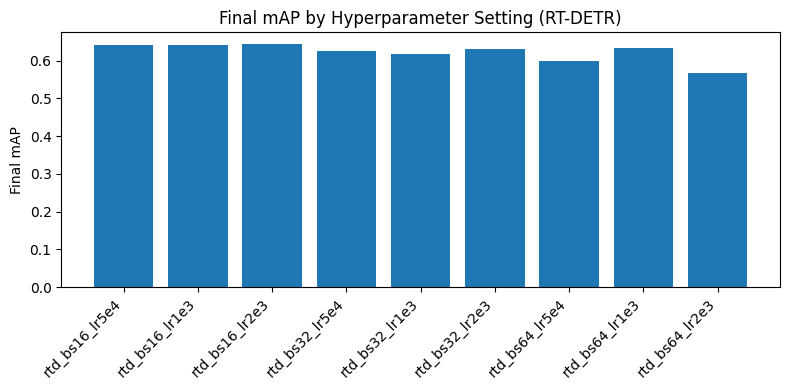

In [ ]:
plot_rtdetr_hparam_summary(rtd_results_df)

This step is used to visualize how RT-DETR's validation performance evolved over epochs for each hyperparameter setting.  The function loops through every RT-DETR run listed in RTDETR_EXPERIMENTS, opens each run's results.csv, and plots the validation mAP curve per epoch on a single figure. Each experiment gets its own line, so I can see how quickly different batch learning rate combinations learn, whether they plateau early, and which settings are both stable and high performing. This plot helps me compare training dynamics across RT-DETR configurations, not just their final mAP values.

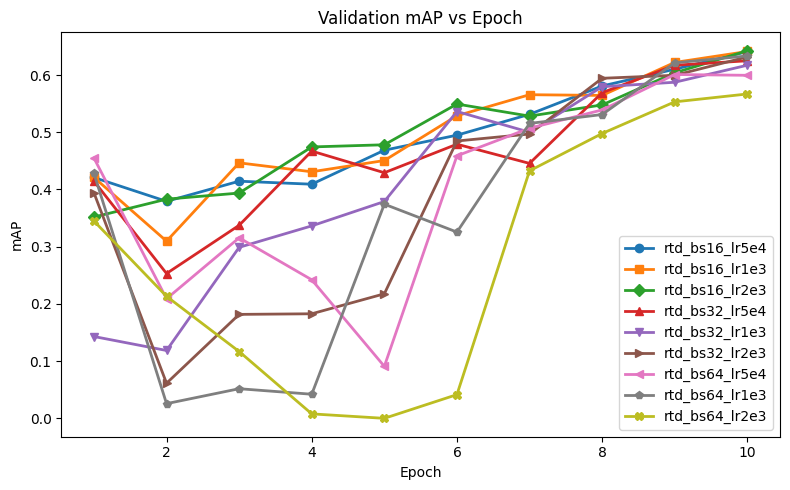

In [ ]:
plot_mAP_curves_for_experiments(RTDETR_EXPERIMENTS)

This step is used to visualize how RT-DETR performance changes across batch size and learning rate settings. The function takes the summary table of RT-DETR experiments (rtd_results_df), groups runs by batch size, and plots final mAP versus initial learning rate (lr0) for each batch on the same chart (with lr0 on a log scale). Each line corresponds to one batch size, so I can quickly see which learning rates work best for a given batch and whether RT-DETR is more sensitive to batch or lr0. This plot provides an at-a-glance view to choose a good RT-DETR hyperparameter region for the final model.

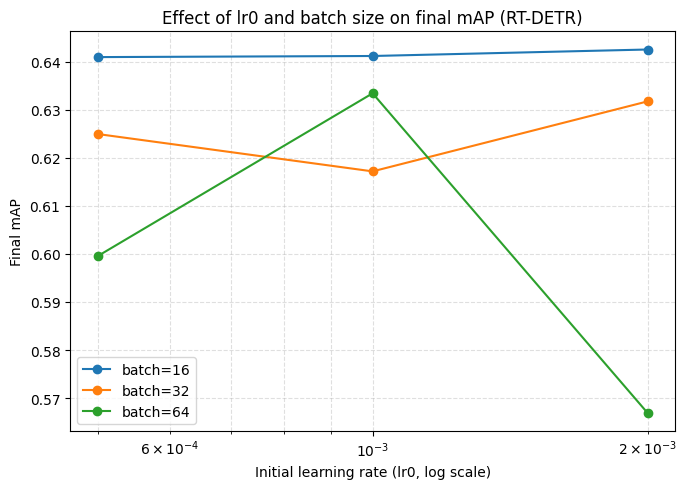

In [ ]:
plot_rtdetr_hparam_grid_visual(rtd_results_df)

In [ ]:
if "final_map" not in rtd_results_df.columns or rtd_results_df["final_map"].isna().all():
    print("[WARN] No valid final mAP values; cannot select best RT-DETR experiment.")
    sys.exit(1)

best_rtd_idx = rtd_results_df["final_map"].idxmax()
best_rtd_row = rtd_results_df.loc[best_rtd_idx]

In [ ]:
print(f"\n[BEST HP] Selected RT-DETR hyperparam experiment: {best_rtd_row['name']}")
display(best_rtd_row.to_frame().T)


[BEST HP] Selected RT-DETR hyperparam experiment: rtd_bs16_lr2e3


,name,final_map,batch,lr0,imgsz,epochs,lrf,train_time_s
2,rtd_bs16_lr2e3,0.64251,16,0.002,640,10,0.01,462.970182


#### RT-DETR Training

In this step, the best RT-DETR hyperparameter setting found during the earlier experiments and turn it into a proper final training run. The variable best_rtd_row already stores the top-performing experiment, so we first build a new run name by appending "_final" to that experiment name. Then we read the corresponding batch size and learning rate (lr0) from that row and pass them into `train_rtdetr_model` along with the detection dataset config, pretrained RT-DETR weights, image size, and number of epochs that match the final YOLO training. AMP is kept disabled to avoid numerical issues. This step effectively re-trains RT-DETR one last time using the best hyperparameters on the full training schedule, and returns the final RT-DETR model, its total training time, and the directory where all logs, metrics, and weights are saved for later evaluation and comparison with YOLOv8.

In [ ]:
rtd_run_name = str(best_rtd_row["name"]) + "_final"
rtd_batch = int(best_rtd_row["batch"])
rtd_lr0 = float(best_rtd_row["lr0"])

rtdetr_model, rtdetr_train_time_s, rtdetr_run_dir = train_rtdetr_model(
    data_cfg=DET_DATA_CONFIG_PATH,
    weights=RTDETR_WEIGHTS,
    run_name=rtd_run_name,
    device="0",
    imgsz=HP_IMGSZ,
    epochs=FINAL_YOLO_EPOCHS,
    batch=rtd_batch,
    lr0=rtd_lr0,
    amp=False,   # keep AMP off for stability
)




[RT-DETR] Training RT-DETR model: rtd_bs16_lr2e3_final
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
engine/trainer: agnostic_nms=False, amp=False, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/Pothole/pothole_det_dataset/data_det.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.002, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtdetr-l.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=rtd_bs16_lr2e3_final, nbs=64, nm

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      1/100      20.7G     0.5628      1.399     0.4568         28        640: 100% ━━━━━━━━━━━━ 99/99 2.1it/s 46.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.737       0.57      0.645       0.36

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      2/100      23.8G     0.5565     0.6033     0.4667         57        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      2/100      23.8G     0.5243     0.7072     0.4143         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 43.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.366      0.341      0.312      0.159

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      3/100      23.8G     0.6265     0.7673     0.5202         61        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      3/100      23.8G     0.5595     0.7457      0.435         41        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.391      0.216      0.183     0.0989

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      4/100      23.8G     0.5768     0.7518      0.483         53        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      4/100      23.8G     0.5711     0.7649     0.4508         32        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.54      0.587      0.563      0.325

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      5/100      23.8G     0.5216     0.6807     0.3985         46        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      5/100      23.8G     0.5368     0.7966     0.4132         30        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.597      0.521       0.51      0.279

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      6/100      23.8G      0.495     0.7977     0.3221         59        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      6/100      23.8G     0.5203     0.7647     0.4189         17        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.679      0.418      0.433      0.264

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      7/100      23.8G     0.5079     0.7195     0.4081         43        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      7/100      23.8G     0.4937     0.7332     0.3828         26        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.689      0.713      0.706      0.439

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      8/100      23.9G     0.4165      0.744     0.3558         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      8/100      23.9G     0.4707     0.7249     0.3654         26        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.689      0.638      0.705      0.447

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      9/100      23.9G     0.4934      0.706     0.3917         43        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


      9/100      23.9G     0.4982     0.7327     0.3891         19        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.744      0.677      0.755      0.438

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     10/100      23.9G     0.4703     0.8877     0.4171         44        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     10/100      23.9G     0.4887     0.7586     0.3839         24        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.681      0.677      0.722      0.477

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     11/100      23.9G     0.4876     0.7595     0.3572         59        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     11/100      23.9G     0.4745     0.7436     0.3584         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.734       0.66      0.773       0.49

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     12/100      23.9G     0.5293     0.8301     0.3812         50        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     12/100      23.9G     0.4588      0.695     0.3625         29        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.802      0.695      0.765      0.482

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     13/100      23.9G     0.3319     0.6445     0.2769         62        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     13/100      23.9G     0.4352     0.6911     0.3546         22        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.768      0.732      0.782      0.484

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     14/100      23.9G     0.5938     0.7433     0.4465         49        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     14/100      23.9G     0.4525     0.6852     0.3619         38        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.8it/s 0.8s
                   all        100        167      0.786      0.725      0.782      0.505

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     15/100      23.9G     0.4845     0.7218     0.3851         63        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     15/100      23.9G     0.4547     0.6742     0.3741         38        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.684      0.677      0.726      0.475

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     16/100      23.9G     0.4743     0.6637     0.3891         52        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     16/100      23.9G      0.446     0.6769     0.3494         26        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.769      0.713      0.756      0.464

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     17/100      23.9G     0.4165     0.6713     0.3536         54        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     17/100      23.9G     0.4437     0.6649     0.3596         17        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.739      0.754      0.785      0.509

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     18/100      23.9G     0.4619     0.5988      0.357         47        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     18/100      23.9G     0.4231     0.6765     0.3397         23        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.814      0.737      0.801       0.54

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     19/100      23.9G     0.4312     0.6397     0.3612         57        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     19/100      23.9G     0.4249     0.6563      0.345         36        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.784      0.782      0.817      0.513

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     20/100      23.9G     0.3852     0.6168     0.3067         53        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     20/100      23.9G     0.4224     0.6435     0.3533         21        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.832      0.701      0.785      0.514

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     21/100      23.9G     0.4131     0.5675     0.3473         51        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     21/100      23.9G     0.4349     0.6463     0.3458         25        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.758      0.749      0.782      0.503

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     22/100      23.9G     0.3969     0.7622     0.2716         53        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     22/100      23.9G     0.4331     0.6724     0.3322         32        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.779      0.796      0.823      0.541

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     23/100      23.9G     0.4512     0.7442     0.3169         44        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     23/100      23.9G     0.4336     0.6551     0.3442         31        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.767      0.689      0.715      0.464

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     24/100      23.9G      0.374     0.7033     0.2669         50        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     24/100      23.9G     0.4163     0.6473     0.3289         19        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.748      0.737       0.82      0.534

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     25/100        24G     0.4607     0.5487     0.3089         65        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     25/100        24G      0.421     0.6844     0.3409         14        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.765      0.546      0.565      0.353

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     26/100        24G     0.3889      0.731     0.3916         44        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     26/100        24G     0.4234     0.6597     0.3328         22        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.726      0.778      0.807      0.527

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     27/100        24G      0.369     0.6871     0.3691         46        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     27/100        24G      0.421     0.6663     0.3377         22        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.803      0.755      0.837      0.566

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     28/100        24G     0.5027     0.6679     0.4203         52        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     28/100        24G     0.4329     0.6649     0.3361         29        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.2it/s 0.8s
                   all        100        167      0.358      0.186       0.17     0.0986

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     29/100        24G     0.3588     0.6239     0.2998         47        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     29/100        24G     0.4273     0.6502     0.3417         30        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.832       0.71      0.805      0.536

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     30/100        24G     0.3833     0.5835     0.3026         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     30/100        24G     0.4217     0.6255     0.3314         22        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167       0.79      0.719      0.816      0.546

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     31/100        24G     0.5978     0.5997     0.4634         47        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     31/100        24G     0.4229     0.6282     0.3296         23        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167       0.84      0.766      0.846      0.574

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     32/100        24G     0.3394     0.6308     0.2071         61        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     32/100        24G     0.4064      0.641     0.3255         22        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.827       0.76      0.857      0.588

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     33/100        24G     0.4371     0.5677     0.2988         64        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     33/100        24G     0.4072     0.6407     0.3325         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.748      0.814      0.821      0.532

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     34/100        24G     0.4202     0.5904     0.4378         41        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     34/100        24G     0.4004     0.6305     0.3228         39        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.701      0.754      0.798      0.519

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     35/100        24G      0.385     0.6362     0.2982         46        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     35/100        24G     0.4067      0.626     0.3211         44        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.857      0.826      0.889      0.597

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     36/100        24G     0.3664     0.4673     0.2463         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     36/100        24G      0.387     0.6323     0.2983         18        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.757      0.804      0.864      0.582

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     37/100        24G     0.4043     0.5996     0.3923         51        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     37/100        24G     0.3979     0.6094     0.3116         25        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.806       0.82       0.86      0.577

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     38/100        24G     0.4145     0.5141     0.3009         52        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     38/100        24G     0.3763     0.5869     0.2977         43        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.792       0.82      0.881        0.6

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     39/100        24G     0.3655     0.4914     0.2675         69        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     39/100        24G     0.3984     0.5781     0.3189         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.858      0.838      0.891      0.599

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     40/100        24G     0.4141     0.6418     0.3034         45        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     40/100        24G     0.3883     0.5841     0.3015         37        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.834       0.82      0.879      0.596

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     41/100        24G     0.4651     0.4876     0.3201         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     41/100        24G      0.389     0.5888     0.3109         24        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.858      0.833      0.879      0.594

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     42/100        24G     0.3712     0.7041     0.3171         35        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     42/100        24G     0.3825     0.5691     0.3001         31        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.866      0.832      0.899      0.577

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     43/100        24G     0.3516     0.5376     0.2836         59        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     43/100        24G     0.3793     0.5694     0.3099         17        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.844      0.838      0.875      0.553

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     44/100        24G     0.4076     0.5338     0.3394         39        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     44/100        24G     0.3857     0.5709     0.3162         40        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.894      0.838      0.911       0.61

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     45/100        24G     0.2862     0.5199     0.1946         58        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     45/100        24G     0.3789     0.5775      0.301         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.836      0.794      0.868      0.584

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     46/100        24G     0.3601     0.5418     0.2658         53        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     46/100        24G     0.3829     0.5887     0.3046         28        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.851      0.808      0.859      0.574

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     47/100        24G     0.4455     0.5437     0.2612         60        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     47/100        24G     0.3872     0.6026     0.3028         25        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167       0.81      0.716      0.769      0.517

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     48/100        24G     0.3612      0.511     0.2253         62        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     48/100        24G      0.379     0.6058     0.2987         24        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.86      0.807      0.884      0.578

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     49/100        24G     0.3571     0.6042      0.356         54        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     49/100        24G     0.3821     0.6216     0.3075         31        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 41.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.843      0.802      0.866      0.538

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     50/100        24G     0.3547     0.6135     0.3145         57        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     50/100        24G     0.3792     0.5932     0.3194         16        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.854      0.808      0.871      0.597

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     51/100        24G     0.3715     0.5711      0.262         60        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     51/100        24G     0.3747     0.5716     0.2965         24        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167       0.89      0.814      0.872      0.582

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     52/100        24G     0.4791     0.4639     0.4362         47        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     52/100        24G     0.3806     0.5867     0.3086         18        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.907      0.819      0.894      0.602

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     53/100        24G     0.3604     0.5516     0.3269         37        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     53/100        24G     0.3728     0.5451     0.2969         25        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.834      0.839      0.895      0.617

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     54/100        24G     0.4054     0.5108     0.4667         44        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     54/100        24G     0.3615     0.5605     0.2971         22        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.883      0.856      0.917      0.633

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     55/100        24G     0.3071     0.5678     0.1863         59        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     55/100        24G      0.377     0.5648      0.289         28        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.849      0.873        0.9      0.603

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     56/100        24G     0.2758     0.5231     0.2656         36        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     56/100        24G     0.3598     0.5458     0.2965         19        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.891      0.862      0.919      0.631

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     57/100        24G     0.3672     0.6962     0.2811         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     57/100        24G     0.3634     0.5803     0.2942         28        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.838      0.826      0.876      0.595

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     58/100        24G     0.3616     0.6192     0.3168         57        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     58/100        24G     0.3644     0.5445     0.3007         25        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.8it/s 0.8s
                   all        100        167      0.889      0.868      0.923      0.633

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     59/100        24G     0.3124     0.4993     0.2633         51        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     59/100        24G     0.3635     0.5495     0.2802         43        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.846      0.886      0.903      0.621

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     60/100        24G     0.3789     0.4633     0.2103         59        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     60/100        24G     0.3638     0.5489     0.2895         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.876      0.874      0.897      0.618

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     61/100        24G     0.3483     0.6213     0.2239         56        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     61/100        24G     0.3556     0.5383     0.2946         24        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.892      0.814        0.9      0.613

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     62/100        24G     0.2922     0.4759     0.1706         66        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     62/100        24G     0.3458     0.5355     0.2742         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.893      0.886      0.915      0.653

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     63/100        24G     0.3296     0.5477     0.2905         48        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     63/100        24G       0.35     0.5289     0.2898         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.875       0.84       0.92      0.656

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     64/100        24G     0.3916      0.499     0.1975         74        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     64/100        24G     0.3519     0.5082     0.2776         32        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.84       0.88       0.91      0.617

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     65/100        24G     0.3443     0.5116     0.2436         49        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     65/100        24G     0.3477     0.5245      0.279         28        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.894      0.874      0.918      0.647

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     66/100        24G     0.3478     0.5317     0.2813         43        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     66/100        24G     0.3476     0.5325     0.2873         27        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.881      0.886      0.922      0.626

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     67/100        24G     0.2771      0.574     0.3058         41        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     67/100        24G     0.3413      0.527     0.2753         16        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.881      0.891       0.92      0.627

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     68/100        24G     0.3103     0.5077     0.3285         47        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     68/100        24G     0.3438     0.5125     0.2835         23        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.846      0.854      0.897      0.613

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     69/100        24G     0.3123     0.5819     0.2128         62        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     69/100        24G     0.3425     0.5284     0.2767         23        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.877      0.899      0.922      0.618

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     70/100        24G     0.3496     0.5812     0.2804         52        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     70/100        24G     0.3416     0.5066     0.2721         31        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.91      0.844      0.933      0.651

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     71/100        24G     0.3717     0.4175     0.3458         44        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     71/100        24G      0.342     0.4866     0.2769         21        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.907       0.88      0.936      0.654

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     72/100        24G      0.359     0.4622     0.2064         61        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     72/100        24G     0.3274     0.4917     0.2624         18        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.881      0.845      0.915      0.646

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     73/100        24G     0.3695     0.5207     0.2279         72        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     73/100        24G      0.334     0.4954     0.2699         19        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.893      0.838      0.911      0.649

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     74/100        24G     0.3864     0.5101      0.228         67        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     74/100        24G     0.3307      0.485     0.2622         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.92      0.844      0.912      0.643

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     75/100        24G     0.3148     0.5513     0.3442         37        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     75/100        24G     0.3293     0.4825     0.2669         17        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.929      0.862      0.928      0.672

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     76/100        24G     0.3009     0.5248      0.283         46        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     76/100        24G     0.3223     0.4948     0.2555         28        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.8it/s 0.8s
                   all        100        167      0.898      0.868      0.936      0.668

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     77/100        24G     0.3014     0.4896     0.2437         48        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     77/100        24G     0.3145      0.482     0.2554         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.944       0.85      0.934      0.661

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     78/100        24G     0.3869      0.422     0.3193         57        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     78/100        24G     0.3263     0.4801      0.258         15        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.851       0.91      0.939      0.663

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     79/100        24G     0.2616     0.3909     0.1952         47        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     79/100        24G     0.3159     0.4784     0.2616         35        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167      0.887       0.89      0.933      0.657

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     80/100        24G      0.389     0.4685     0.2708         50        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     80/100        24G     0.3187     0.4613     0.2577         21        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.891      0.881      0.931      0.662

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     81/100        24G     0.2961     0.4275     0.1832         74        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     81/100        24G     0.3077     0.4613     0.2548         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167       0.93      0.874      0.944       0.67

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     82/100        24G     0.3597     0.4742     0.1809         72        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     82/100        24G     0.3065     0.4616     0.2407         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.906      0.892      0.933       0.67

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     83/100        24G     0.2818     0.3981      0.191         51        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     83/100        24G     0.3147     0.4482     0.2598         23        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.9it/s 0.8s
                   all        100        167        0.9      0.886      0.944       0.67

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     84/100        24G     0.3259     0.5062     0.2463         66        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     84/100        24G     0.3139     0.4639     0.2568         36        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167        0.9      0.862      0.943      0.661

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     85/100        24G     0.2324     0.5029     0.2173         36        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     85/100        24G     0.3106     0.4458     0.2478         18        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.851      0.916      0.935      0.666

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     86/100        24G     0.3325     0.4248     0.1522         78        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     86/100        24G     0.3015      0.453     0.2431         34        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.896       0.91      0.943      0.678

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     87/100        24G     0.3737     0.4374     0.2646         53        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     87/100        24G     0.3102     0.4504      0.252         32        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167       0.89      0.822      0.915       0.66

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     88/100        24G     0.3096     0.4155     0.2153         34        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     88/100        24G     0.2943     0.4348     0.2281         20        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.895      0.904      0.956      0.681

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     89/100        24G     0.2224     0.3493     0.1439         66        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     89/100        24G     0.2942     0.4185      0.236         18        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.8it/s 0.8s
                   all        100        167      0.894      0.904       0.94       0.68

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     90/100        24G     0.3411     0.4859     0.2701         29        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     90/100        24G     0.2979     0.4345     0.2344         26        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.875      0.892      0.934      0.686
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     91/100        24G     0.2843     0.4101     0.3109         25        640: 0% ──────────── 0/99  2.1s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     91/100        24G     0.2374     0.3588     0.2206         11        640: 100% ━━━━━━━━━━━━ 99/99 2.2it/s 44.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.914      0.916      0.962      0.691

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     92/100        24G     0.2679     0.3903     0.2033         26        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     92/100        24G     0.2321     0.3444     0.2005         23        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 4.8it/s 0.8s
                   all        100        167      0.921      0.907      0.944      0.689

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     93/100        24G     0.1862     0.3235     0.1084         32        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     93/100        24G     0.2332     0.3403     0.2029          9        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.1it/s 0.8s
                   all        100        167      0.938      0.898      0.961      0.691

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     94/100        24G     0.2865     0.3528      0.219         27        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     94/100        24G     0.2251     0.3243     0.1913         18        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.956      0.898      0.963      0.698

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     95/100        24G     0.2573     0.3852     0.1706         40        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     95/100        24G     0.2241     0.3324      0.195         13        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.923      0.922      0.964      0.709

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     96/100        24G      0.233     0.3535     0.1324         26        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     96/100        24G     0.2174     0.3205     0.1899         10        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.917      0.916      0.959      0.712

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     97/100        24G     0.1796     0.2632     0.1522         20        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     97/100        24G      0.215     0.3188     0.1814         29        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.938      0.904      0.964      0.708

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     98/100        24G     0.1894      0.239     0.1445         25        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     98/100        24G     0.2109     0.3175     0.1872         17        640: 100% ━━━━━━━━━━━━ 99/99 2.3it/s 42.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.918      0.928      0.964      0.703

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
     99/100        24G     0.2029     0.3053     0.1977         21        640: 0% ──────────── 0/99  0.5s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


     99/100        24G     0.2186      0.319     0.1862         12        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167       0.93      0.922      0.964      0.708

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
    100/100        24G     0.1661     0.2729     0.2264         19        640: 0% ──────────── 0/99  0.4s

/usr/local/lib/python3.12/dist-packages/torch/autograd/graph.py:841: UserWarning: grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass


    100/100        24G     0.2116     0.3197     0.1793         32        640: 100% ━━━━━━━━━━━━ 99/99 2.4it/s 42.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4/4 5.0it/s 0.8s
                   all        100        167      0.923      0.932      0.965      0.708

100 epochs completed in 1.235 hours.
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3_final/weights/last.pt, 66.2MB
Optimizer stripped from /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3_final/weights/best.pt, 66.2MB

Validating /content/drive/MyDrive/Pothole/dataset/pothole_runs/rtd_bs16_lr2e3_final/weights/best.pt...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 4

In [ ]:
# VALIDATION metrics for RT-DETR
rtdetr_val_metrics = evaluate_model(rtdetr_model, DET_DATA_CONFIG_PATH, device="0", split="val")

[INFO] Running evaluation on split='val'...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
val: Fast image access ✅ (ping: 0.8±0.8 ms, read: 15.8±13.9 MB/s, size: 64.0 KB)
val: Scanning /content/drive/MyDrive/Pothole/pothole_det_dataset/valid/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 122.3Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 2.2s/it 15.5s
                   all        100        167      0.917      0.916      0.959      0.711
Speed: 2.4ms preprocess, 147.3ms inference, 0.0ms loss, 0.4ms postprocess per image
Results saved to /content/runs/detect/val

[RESULTS] Metrics :
  Box mAP@0.5:     0.9586
  Box mAP@0.5:0.95 0.7112
  Box Precision:   0.9171
  Box Recall:      0.9162


This step is used to visualize how the final RT-DETR training behaved over time.

the helper function loads the results.csv file from the RT-DETR run directory and plots two things over epochs:

- Training losses (to check if the model is converging or overfitting), and

- Validation mAP metrics (to see how detection performance improves or plateaus).

These learning curves make it easy to describe and diagnose the RT-DETR training process in the report, instead of just showing the final mAP number.

[INFO] Head of results.csv:


,epoch,time,train/giou_loss,train/cls_loss,train/l1_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/giou_loss,val/cls_loss,val/l1_loss,lr/pg0,lr/pg1,lr/pg2
0,1,47.3978,0.56279,1.39872,0.45680,0.73677,0.56987,0.64512,0.35963,0.46340,0.81940,0.56944,0.000660,0.000660,0.000660
1,2,92.7791,0.52430,0.70719,0.41426,0.36575,0.34132,0.31154,0.15934,0.54527,1.05195,0.71020,0.001313,0.001313,0.001313
2,3,137.5840,0.55954,0.74567,0.43499,0.39093,0.21557,0.18254,0.09895,1.04220,0.78747,1.41170,0.001954,0.001954,0.001954
3,4,181.8100,0.57110,0.76492,0.45079,0.54016,0.58683,0.56289,0.32467,0.46525,0.74314,0.54207,0.001941,0.001941,0.001941
4,5,225.8500,0.53683,0.79658,0.41324,0.59724,0.52096,0.51030,0.27858,0.59629,1.49204,1.01203,0.001921,0.001921,0.001921


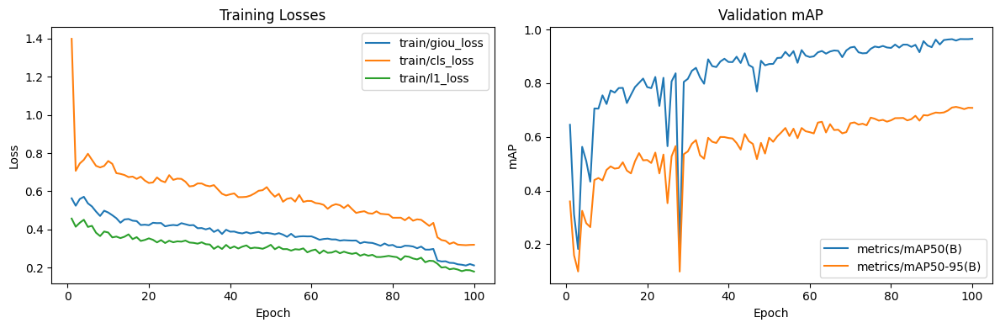

In [ ]:
plot_learning_curves(rtdetr_run_dir)

In this step, we use the show_validation_predictions helper to visually inspect RT-DETR's predictions on a few validation images.

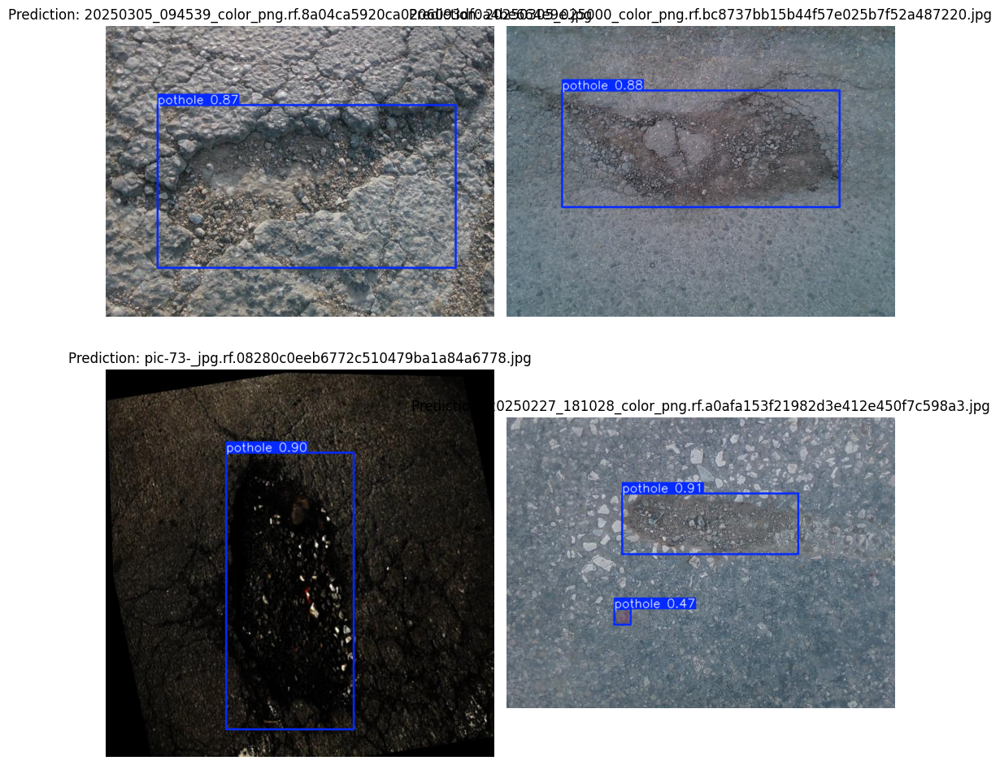

In [ ]:
show_validation_predictions(rtdetr_model, DATA_ROOT, num_samples=4, device="0",
                            conf_thresh=0.4, iou_thresh=0.45)

### Model metric comparison

Following are the helper function that support the visulaization and comprasion of the Yolo and RT-DERT. We call compare_yolo_rtdetr_metrics(yolo_val_metrics, rtdetr_val_metrics) to directly compare YOLOv8 and RT-DETR on the same validation split.

This helper takes the validation metric objects from both models, extracts the key detection scores (mAP@0.5, mAP@0.5:0.95, precision, and recall), and puts them into a single side-by-side table. It also generates a bar chart that plots these metrics for YOLOv8-seg_final vs RT-DETR-L on the same axes. This step makes it easy to see which model is more accurate and which one is better at finding potholes consistently (recall) vs being precise (precision), instead of looking at each model’s results in isolation.

In [ ]:

def compare_yolo_rtdetr_metrics(yolo_metrics, rtdetr_metrics):
    yolo_dict = extract_box_metrics(yolo_metrics)
    rtdetr_dict = extract_box_metrics(rtdetr_metrics)

    df = pd.DataFrame.from_dict(
        {
            "YOLOv8-seg_final": yolo_dict,
            "RT-DETR-L": rtdetr_dict,
        },
        orient="index",
    )
    print("\n[MODEL METRIC COMPARISON]")
    display(df)

    metrics = ["map50", "map5095", "precision", "recall"]
    x = np.arange(len(metrics))
    width = 0.35

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.bar(x - width/2, df.loc["YOLOv8-seg_final", metrics], width, label="YOLOv8-seg_final")
    ax.bar(x + width/2, df.loc["RT-DETR-L", metrics], width, label="RT-DETR-L")

    ax.set_xticks(x)
    ax.set_xticklabels(["mAP@0.5", "mAP@0.5:0.95", "Precision", "Recall"])
    ax.set_ylim(0, 1)
    ax.set_ylabel("Score")
    ax.set_title("YOLOv8-seg_final vs RT-DETR-L (Box Metrics)")
    ax.legend()
    plt.tight_layout()
    plt.show()


def compare_models_on_samples(
    yolo_model,
    rtdetr_model,
    dataset_root: Path,
    num_samples: int = 3,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
):
    print("[INFO] Showing YOLOv8-seg vs RT-DETR-L qualitative comparison...")
    val_dir = dataset_root / "valid"
    img_files, _ = list_images_labels(val_dir)
    if not img_files:
        print("No validation images found for detection dataset.")
        return

    num_samples = min(num_samples, len(img_files))
    sample_paths = random.sample(img_files, num_samples)

    rows = 2
    cols = num_samples
    fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 6 * rows))

    if cols == 1:
        axes = np.array([[axes[0]], [axes[1]]])

    for col, img_path in enumerate(sample_paths):
        img = cv2.imread(str(img_path))
        if img is None:
            continue

        res_y = yolo_model.predict(
            source=img,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )[0]
        ann_y = res_y.plot()
        ann_y_rgb = cv2.cvtColor(ann_y, cv2.COLOR_BGR2RGB)
        axes[0, col].imshow(ann_y_rgb)
        axes[0, col].set_title(f"YOLOv8-seg_final\n{img_path.name}")
        axes[0, col].axis("off")

        res_r = rtdetr_model.predict(
            source=img,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )[0]
        ann_r = res_r.plot()
        ann_r_rgb = cv2.cvtColor(ann_r, cv2.COLOR_BGR2RGB)
        axes[1, col].imshow(ann_r_rgb)
        axes[1, col].set_title("RT-DETR-L")
        axes[1, col].axis("off")

    plt.suptitle("YOLOv8-seg_final vs RT-DETR-L (Validation Samples)", fontsize=14)
    plt.tight_layout()
    plt.show()

def benchmark_inference_speed_on_images(
    model,
    dataset_root: Path,
    name: str,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    max_images: int = 50,
):
    """
    Benchmark inference speed and GPU memory usage (if CUDA available)
    on validation images.
    """
    val_dir = dataset_root / "valid"
    img_files, _ = list_images_labels(val_dir)
    if not img_files:
        print(f"[WARN] No validation images found for benchmark: {name}")
        return {
            "name": name,
            "n_images": 0,
            "total_time_s": np.nan,
            "avg_time_s": np.nan,
            "fps": np.nan,
            "max_mem_mb": np.nan,
        }

    img_files = img_files[:max_images]

    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        torch.cuda.reset_peak_memory_stats()

    print(f"\n[BENCH] Inference benchmark for {name} on {len(img_files)} images...")
    if torch.cuda.is_available():
        torch.cuda.synchronize()
    t0 = time.time()

    for img_path in img_files:
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        _ = model.predict(
            source=img,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )

    if torch.cuda.is_available():
        torch.cuda.synchronize()
    t1 = time.time()

    total_time = t1 - t0
    n = len(img_files)
    avg_time = total_time / n if n > 0 else np.nan
    fps = n / total_time if total_time > 0 else np.nan

    max_mem_mb = np.nan
    if torch.cuda.is_available():
        max_mem_mb = torch.cuda.max_memory_allocated() / (1024 ** 2)

    print(f"  Total time: {total_time:.3f} s for {n} images")
    print(f"  Avg time : {avg_time:.4f} s / image")
    print(f"  FPS      : {fps:.2f}")
    if not np.isnan(max_mem_mb):
        print(f"  Max GPU memory: {max_mem_mb:.1f} MB")

    return {
        "name": name,
        "n_images": n,
        "total_time_s": total_time,
        "avg_time_s": avg_time,
        "fps": fps,
        "max_mem_mb": max_mem_mb,
    }


def plot_inference_benchmark(results_list: List[dict]):
    df = pd.DataFrame(results_list)
    print("\n[INFERENCE BENCHMARK SUMMARY]")
    display(df)

    # FPS comparison
    plt.figure(figsize=(6, 4))
    x = np.arange(len(df))
    plt.bar(x, df["fps"])
    plt.xticks(x, df["name"], rotation=30, ha="right")
    plt.ylabel("FPS")
    plt.title("Inference Speed Comparison (higher is better)")
    plt.tight_layout()
    plt.show()

    # Memory comparison (if GPU used)
    if "max_mem_mb" in df.columns and not df["max_mem_mb"].isna().all():
        plt.figure(figsize=(6, 4))
        plt.bar(x, df["max_mem_mb"])
        plt.xticks(x, df["name"], rotation=30, ha="right")
        plt.ylabel("Max GPU Memory (MB)")
        plt.title("GPU Memory Usage during Inference")
        plt.tight_layout()
        plt.show()


def plot_training_time_comparison(yolo_train_time_s: float, rtdetr_train_time_s: float):
    df = pd.DataFrame([
        {"model": "YOLOv8-seg_final", "train_time_s": yolo_train_time_s},
        {"model": "RT-DETR-L", "train_time_s": rtdetr_train_time_s},
    ])
    print("\n[TRAINING TIME SUMMARY]")
    display(df)
    print("\n\n")
    x = np.arange(len(df))
    plt.figure(figsize=(6, 4))
    plt.bar(x, df["train_time_s"] / 60.0)
    plt.xticks(x, df["model"], rotation=30, ha="right")
    plt.ylabel("Training Time (minutes)")
    plt.title("Training Wall-Clock Time Comparison")
    plt.tight_layout()
    plt.show()


[MODEL METRIC COMPARISON]


,map50,map5095,precision,recall
YOLOv8-seg_final,0.973534,0.794507,0.962984,0.940120
RT-DETR-L,0.958575,0.711150,0.917056,0.916168


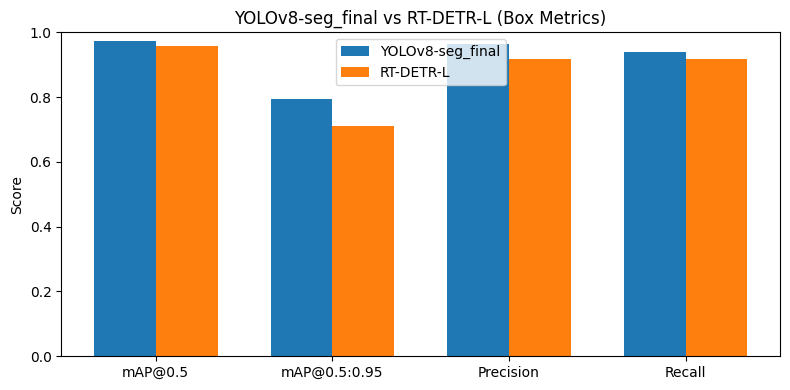

In [ ]:
compare_yolo_rtdetr_metrics(yolo_val_metrics, rtdetr_val_metrics)

In this step, we call `compare_models_on_sample` to do a visual side-by-side comparison of YOLOv8 and RT-DETR on the same test images. The function randomly picks 5 images from the detection dataset and, for each one, runs both best_yolo_model and rtdetr_model with the same confidence and IoU thresholds. It then plots the annotated outputs in a 2-row grid: YOLO predictions on the top row and RT-DETR predictions on the bottom row for the same images. This makes it easy to visually inspect how both models draw bounding boxes on the same potholes, where they agree, and where one model might miss or over-detect compared to the other.

[INFO] Showing YOLOv8-seg vs RT-DETR-L qualitative comparison...


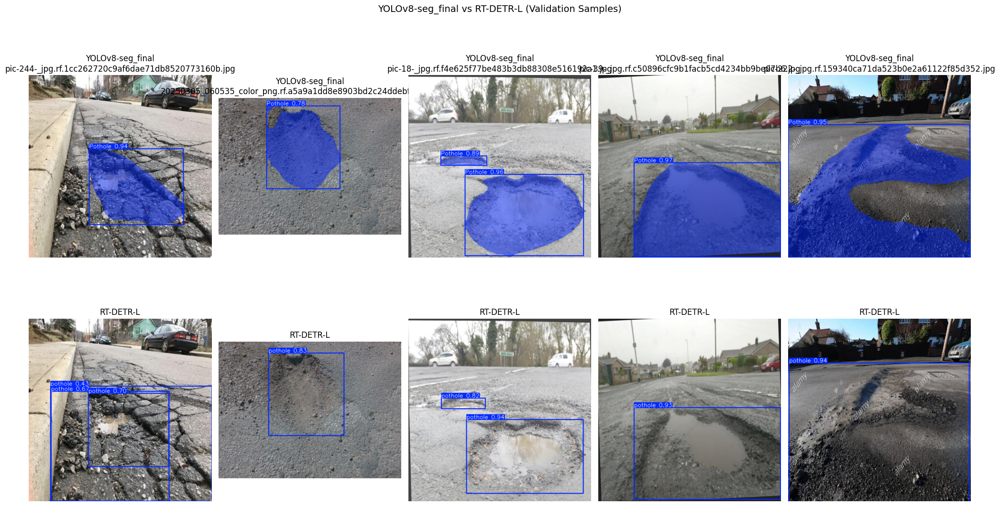

In [ ]:
compare_models_on_samples(
    yolo_model=best_yolo_model,
    rtdetr_model=rtdetr_model,
    dataset_root=DET_DATA_ROOT,
    num_samples=5,
    device="0",
    conf_thresh=0.4,
    iou_thresh=0.45,
)

### Benchmark training time and inference speed

To compare how long each model took to train. The helper function shows a table with the total training time for the final YOLOv8 model and the final RT-DETR model, and then plots a bar chart (in minutes) showing both side by side.


[TRAINING TIME SUMMARY]


,model,train_time_s
0,YOLOv8-seg_final,2405.560811
1,RT-DETR-L,4461.540893


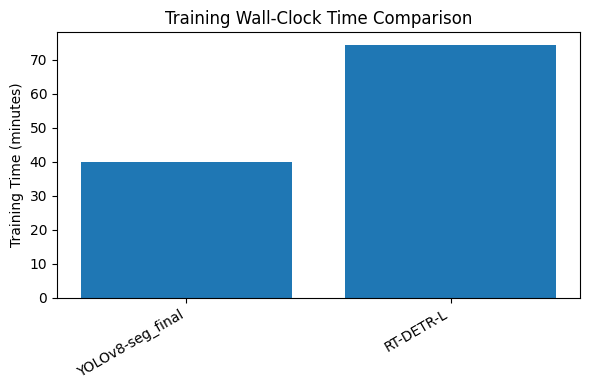

In [ ]:
plot_training_time_comparison(yolo_train_time_s, rtdetr_train_time_s)


[BENCH] Inference benchmark for YOLOv8-seg_final on 50 images...
  Total time: 1.149 s for 50 images
  Avg time : 0.0230 s / image
  FPS      : 43.50
  Max GPU memory: 1092.7 MB

[BENCH] Inference benchmark for RT-DETR-L on 50 images...
  Total time: 2.381 s for 50 images
  Avg time : 0.0476 s / image
  FPS      : 21.00
  Max GPU memory: 1094.1 MB

[INFERENCE BENCHMARK SUMMARY]


,name,n_images,total_time_s,avg_time_s,fps,max_mem_mb
0,YOLOv8-seg_final,50,1.149404,0.022988,43.500795,1092.665527
1,RT-DETR-L,50,2.380731,0.047615,21.001952,1094.145996


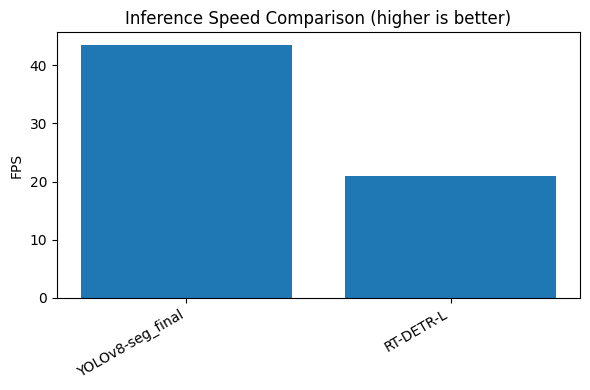

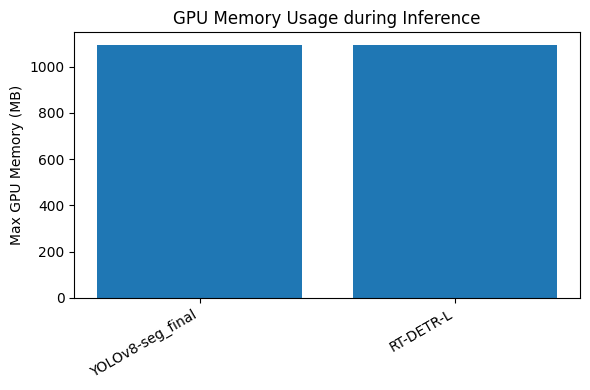

In [ ]:
bench_results = []
bench_results.append(
    benchmark_inference_speed_on_images(
        model=best_yolo_model,
        dataset_root=DET_DATA_ROOT,
        name="YOLOv8-seg_final",
        device="0",
        conf_thresh=0.4,
        iou_thresh=0.45,
        max_images=50,
    )
)
bench_results.append(
    benchmark_inference_speed_on_images(
        model=rtdetr_model,
        dataset_root=DET_DATA_ROOT,
        name="RT-DETR-L",
        device="0",
        conf_thresh=0.4,
        iou_thresh=0.45,
        max_images=50,
    )
)

plot_inference_benchmark(bench_results)

## Model Evaluation

In the final evaluation stage, we measure both YOLOv8-seg and RT-DETR on the same held-out test split.For each model, evaluate_model runs Ultralytics .val() on the test set and reports:

- Box mAP@0.5 and Box mAP@0.5:0.95 - overall detection quality of the bounding boxes.

- Box precision and Box recall - how accurate the detections are and how many true potholes are recovered.

- Mask mAP@0.5 and Mask mAP@0.5:0.95 (when available) - segmentation quality for the predicted masks.

Although the concrete values in the notebook output are just examples, these metrics together provide a consistent way to compare YOLOv8-seg and RT-DETR side by side on the unseen test set and to summarize their final detection and segmentation performance in the report.

### Metrics

In [ ]:
yolo_test_metrics = evaluate_model(best_yolo_model, DATA_CONFIG_PATH, device="0", split="test")

[INFO] Running evaluation on split='test'...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
val: Fast image access ✅ (ping: 1.0±1.3 ms, read: 32.2±20.1 MB/s, size: 87.4 KB)
val: Scanning /content/drive/MyDrive/Pothole/dataset/test/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 133.6Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95)     Mask(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.0it/s 2.4s
                   all        100        174      0.929      0.983      0.972      0.787      0.935      0.988      0.981      0.763
Speed: 1.7ms preprocess, 4.9ms inference, 0.1ms loss, 3.4ms postprocess per image
Results saved to /content/runs/segment/val2

[RESULTS] Metrics :
  Box mAP@0.5:     0.9723
  Box mAP@0.5:0.95 0.7868
  Box Precision:   0.9293
  Box Recall:      0.9826
  Mask mAP@0.5:    0.9814
  Mask mAP@0.5:0.950.7635


[INFO] Building image-level confusion matrix on 'test' split...


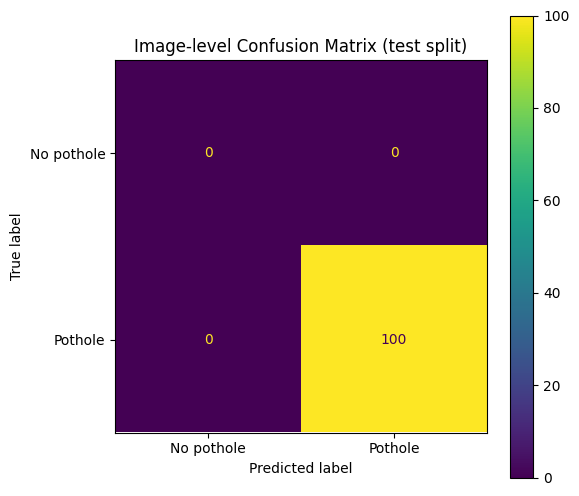

Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]


In [ ]:
build_image_level_confusion_matrix(best_yolo_model, DATA_ROOT, device="0",
                                    conf_thresh=0.4, iou_thresh=0.45, split="test")

In [ ]:
rtdetr_val_metrics = evaluate_model(rtdetr_model, DATA_CONFIG_PATH, device="0", split="test")

[INFO] Running evaluation on split='test'...
Ultralytics 8.3.235 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-80GB, 81222MiB)
rt-detr-l summary: 302 layers, 31,985,795 parameters, 0 gradients, 103.4 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 51.2±12.3 MB/s, size: 73.2 KB)
val: Scanning /content/drive/MyDrive/Pothole/dataset/test/labels.cache... 100 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 100/100 140.9Kit/s 0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 7/7 3.2it/s 2.2s
                   all        100        174      0.935      0.914      0.963      0.698
Speed: 2.8ms preprocess, 8.1ms inference, 0.0ms loss, 1.0ms postprocess per image
Results saved to /content/runs/detect/val2

[RESULTS] Metrics :
  Box mAP@0.5:     0.9632
  Box mAP@0.5:0.95 0.6984
  Box Precision:   0.9353
  Box Recall:      0.9138


[INFO] Building image-level confusion matrix on 'test' split...


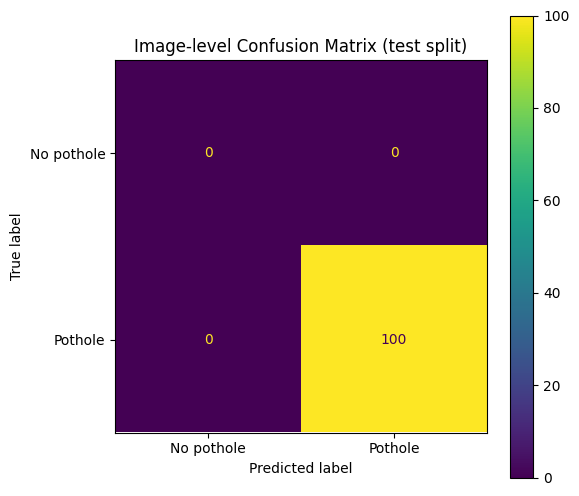

Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]


In [ ]:
build_image_level_confusion_matrix(rtdetr_model, DATA_ROOT, device="0",
                                    conf_thresh=0.4, iou_thresh=0.45, split="test")

### IoU/F1 comparison

In [ ]:
def build_gt_mask(img_path: Path, label_path: Path) -> np.ndarray:
    """
    Build a binary ground-truth mask from YOLO segmentation polygons.
    """
    img = cv2.imread(str(img_path))
    if img is None:
        raise RuntimeError(f"Could not read image {img_path}")
    h, w = img.shape[:2]
    mask = np.zeros((h, w), dtype=np.uint8)

    if not label_path.exists():
        return mask

    polys = yolo_seg_polygons(label_path, w, h)
    for cls_id, pts in polys:
        pts_np = np.array(pts, dtype=np.int32)
        cv2.fillPoly(mask, [pts_np], 255)
    return mask


def yolo_pred_mask(
    model: YOLO,
    img_path: Path,
    device: str = "0",
    conf_thresh: float = 0.4
) -> np.ndarray:
    """
    Build a binary mask from YOLOv8-seg predicted masks.
    """
    res = model.predict(
        source=str(img_path),
        conf=conf_thresh,
        device=device,
        verbose=False
    )
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]
    mask_pred = np.zeros((h, w), dtype=np.uint8)

    if res[0].masks is None:
        return mask_pred

    for m in res[0].masks.data.cpu().numpy():
        m_bin = (m > 0.5).astype(np.uint8) * 255
        # combine multiple instance masks
        mask_pred = np.maximum(mask_pred, m_bin.astype(np.uint8))
    return mask_pred


def rtdetr_pred_mask(
    model: RTDETR,
    img_path: Path,
    device: str = "0",
    conf_thresh: float = 0.4
) -> np.ndarray:
    """
    Build a binary mask from RT-DETR predicted bounding boxes
    by filling each box as a solid region.
    """
    res = model.predict(
        source=str(img_path),
        conf=conf_thresh,
        device=device,
        verbose=False
    )
    img = cv2.imread(str(img_path))
    h, w = img.shape[:2]
    mask_pred = np.zeros((h, w), dtype=np.uint8)

    if res[0].boxes is None or len(res[0].boxes) == 0:
        return mask_pred

    boxes_xyxy = res[0].boxes.xyxy.cpu().numpy()
    for box in boxes_xyxy:
        x1, y1, x2, y2 = box.astype(int)
        # clip to image bounds
        x1 = max(0, min(x1, w - 1))
        x2 = max(0, min(x2, w - 1))
        y1 = max(0, min(y1, h - 1))
        y2 = max(0, min(y2, h - 1))
        if x2 > x1 and y2 > y1:
            cv2.rectangle(mask_pred, (x1, y1), (x2, y2), 255, thickness=-1)

    return mask_pred


def iou_and_f1(pred_mask: np.ndarray, gt_mask: np.ndarray):
    """
    Compute pixel-level IoU and F1 between predicted and ground-truth masks.
    """
    pred_bin = pred_mask > 0
    gt_bin = gt_mask > 0

    inter = np.logical_and(pred_bin, gt_bin).sum()
    union = np.logical_or(pred_bin, gt_bin).sum()
    iou = inter / union if union > 0 else 0.0

    tp = inter
    fp = (pred_bin & ~gt_bin).sum()
    fn = (~pred_bin & gt_bin).sum()

    precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
    recall   = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    f1 = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0

    return iou, f1


def compare_yolo_rtdetr_iou_f1(
    yolo_model: YOLO,
    rtdetr_model: RTDETR,
    dataset_root: Path,
    max_images: int = 30,
    device: str = "0",
    conf_thresh: float = 0.4,
):
    """
    Compare YOLOv8-seg vs RT-DETR using pixel-level IoU and F1
    against ground-truth segmentation masks.

    - Ground truth: polygon masks from seg labels
    - YOLO: predicted seg masks
    - RT-DETR: filled bounding-box masks
    """
    print(f"[INFO] Comparing YOLOv8-seg vs RT-DETR on up to {max_images} validation images...")
    val_dir = dataset_root / "valid"
    img_files, _ = list_images_labels(val_dir)
    if not img_files:
        print("No validation images found.")
        return

    img_files = img_files[:max_images]

    iou_yolo, f1_yolo = [], []
    iou_rtd,  f1_rtd  = [], []

    for img_path in img_files:
        label_path = (val_dir / "labels" / img_path.name).with_suffix(".txt")
        if not label_path.exists():
            continue

        gt_mask = build_gt_mask(img_path, label_path)

        y_mask = yolo_pred_mask(
            yolo_model,
            img_path,
            device=device,
            conf_thresh=conf_thresh
        )
        r_mask = rtdetr_pred_mask(
            rtdetr_model,
            img_path,
            device=device,
            conf_thresh=conf_thresh
        )

        i_y, f_y = iou_and_f1(y_mask, gt_mask)
        i_r, f_r = iou_and_f1(r_mask, gt_mask)

        iou_yolo.append(i_y)
        f1_yolo.append(f_y)
        iou_rtd.append(i_r)
        f1_rtd.append(f_r)

    print("\nYOLOv8-seg vs RT-DETR (pixel IoU/F1)")
    print(f"# images evaluated: {len(iou_yolo)}")
    print(f"YOLOv8-seg - mean IoU: {np.mean(iou_yolo):.3f}, mean F1: {np.mean(f1_yolo):.3f}")
    print(f"RT-DETR    - mean IoU: {np.mean(iou_rtd):.3f}, mean F1: {np.mean(f1_rtd):.3f}")

    labels = ["YOLOv8-seg", "RT-DETR-L"]
    mean_iou = [np.mean(iou_yolo), np.mean(iou_rtd)]
    mean_f1  = [np.mean(f1_yolo),  np.mean(f1_rtd)]

    x = np.arange(len(labels))
    width = 0.35
    fig, ax = plt.subplots(figsize=(6, 4))
    ax.bar(x - width/2, mean_iou, width, label="IoU")
    ax.bar(x + width/2, mean_f1,  width, label="F1")
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.set_ylim(0, 1)
    ax.set_ylabel("Score")
    ax.set_title("YOLOv8-seg vs RT-DETR-L (mean pixel IoU & F1)")
    ax.legend()
    plt.tight_layout()
    plt.show()


This step compare YOLOv8-seg and RT-DETR at the pixel level rather than only using mAP. The function takes up to max_images=100 from the segmentation dataset (DATA_ROOT), builds a ground-truth mask from the polygon annotations for each image, and then runs both best_yolo_model and rtdetr_model on the same images using the given confidence threshold (conf_thresh=0.4). For each model it converts the predictions into binary masks, computes Intersection over Union (IoU) and F1-score against the ground truth, and then averages these scores across all evaluated images. Finally, it reports and plots the mean IoU and F1 for YOLO and RT-DETR side by side, providing a direct, interpretable comparison of how well each model localizes potholes in terms of pixel-accurate segmentation quality.

[INFO] Comparing YOLOv8-seg vs RT-DETR on up to 100 validation images...

YOLOv8-seg vs RT-DETR (pixel IoU/F1)
# images evaluated: 100
YOLOv8-seg - mean IoU: 0.842, mean F1: 0.903
RT-DETR    - mean IoU: 0.622, mean F1: 0.756


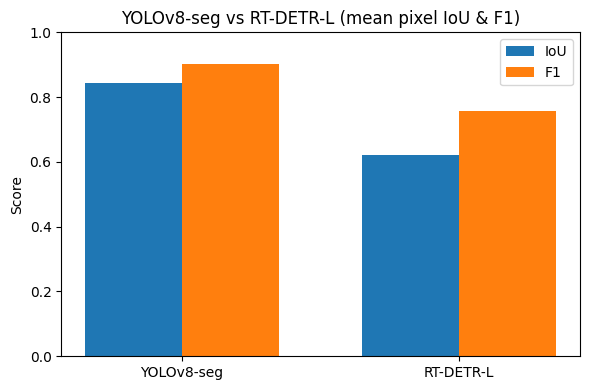

In [ ]:
compare_yolo_rtdetr_iou_f1(
    yolo_model=best_yolo_model,
    rtdetr_model=rtdetr_model,
    dataset_root=DATA_ROOT,
    max_images=100,
    device="0",
    conf_thresh=0.4,
)


### Robustness test

The following functions is used to **visually compare the robustness** of YOLOv8-seg and RT-DETR under different image corruptions. It randomly picks one image from the **test set**, then creates several corrupted versions of that image (clean, dark, bright, blurred, and noisy). For each corruption, it runs both `yolo_model` and `rtdetr_model` and plots their predictions side by side: the **top row** shows YOLO’s outputs and the **bottom row** shows RT-DETR’s outputs for the same corrupted inputs. This grid of images makes it easy to qualitatively inspect how each model behaves when the input quality degrades, and to see which model is more stable across different lighting and noise conditions.


In [ ]:
def apply_dark(img: np.ndarray, factor: float = 0.5) -> np.ndarray:
    return np.clip(img.astype(np.float32) * factor, 0, 255).astype(np.uint8)


def apply_bright(img: np.ndarray, factor: float = 1.5) -> np.ndarray:
    return np.clip(img.astype(np.float32) * factor, 0, 255).astype(np.uint8)


def apply_blur(img: np.ndarray, ksize: int = 9) -> np.ndarray:
    ksize = ksize if ksize % 2 == 1 else ksize + 1
    return cv2.GaussianBlur(img, (ksize, ksize), 0)


def apply_noise(img: np.ndarray, sigma: float = 15.0) -> np.ndarray:
    noise = np.random.normal(0, sigma, img.shape).astype(np.float32)
    noisy = img.astype(np.float32) + noise
    return np.clip(noisy, 0, 255).astype(np.uint8)

def run_robustness_experiments(
    yolo_model,
    rtdetr_model,
    dataset_root: Path,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    model_names=("YOLOv8-seg_final", "RT-DETR-L"),
):
    """
    Compare robustness of YOLOv8-seg and RT-DETR on corrupted validation images.
    We keep the same GT labels (image-level pothole / no-pothole) and
    compute Precision/Recall/F1 for each corruption condition and model.
    """
    print("[INFO] Running robustness experiments (YOLO vs RT-DETR)...")
    test_dir = dataset_root / "test"
    img_files, _ = list_images_labels(test_dir)
    if not img_files:
        print("No validation images found.")
        return

    # 1) Ground-truth: does this image contain at least one pothole?
    gt_presence = {}
    for img_path in img_files:
        label_path = (test_dir / "labels" / img_path.name).with_suffix(".txt")
        has = 0
        if label_path.exists():
            with open(label_path, "r") as f:
                for line in f:
                    if line.strip():
                        has = 1
                        break
        gt_presence[img_path] = has

    corruptions = {
        "clean":  lambda img: img,
        "dark":   apply_dark,
        "bright": apply_bright,
        "blur":   apply_blur,
        "noise":  apply_noise,
    }

    models = [yolo_model, rtdetr_model]
    model_names = list(model_names)

    all_results = []

    for cond_name, transform in corruptions.items():
        print(f"\n[COND] {cond_name}")

        for model, mname in zip(models, model_names):
            y_true, y_pred = [], []

            for img_path in img_files:
                y_true.append(gt_presence[img_path])

                img = cv2.imread(str(img_path))
                if img is None:
                    y_pred.append(0)
                    continue

                img_corr = transform(img)

                res = model.predict(
                    source=img_corr,
                    conf=conf_thresh,
                    iou=iou_thresh,
                    device=device,
                    verbose=False,
                )
                boxes = res[0].boxes
                pred_has = 1 if boxes is not None and len(boxes) > 0 else 0
                y_pred.append(pred_has)

            cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
            if cm.shape == (2, 2):
                tn, fp, fn, tp = cm.ravel()
            else:
                tn = fp = fn = tp = 0

            precision = tp / (tp + fp) if (tp + fp) > 0 else 0.0
            recall   = tp / (tp + fn) if (tp + fn) > 0 else 0.0
            f1       = 2 * precision * recall / (precision + recall) if (precision + recall) > 0 else 0.0

            print(f"  [{mname}]")
            print("    Confusion matrix (rows=true, cols=pred):")
            print(cm)
            print(f"    Precision: {precision:.3f}, Recall: {recall:.3f}, F1: {f1:.3f}")

            all_results.append({
                "model": mname,
                "condition": cond_name,
                "precision": precision,
                "recall": recall,
                "f1": f1,
            })

    df = pd.DataFrame(all_results)
    print("\n[ROBUSTNESS SUMMARY - YOLO vs RT-DETR]")
    display(df)

    # === Side-by-side bar plots per metric ===
    conditions = sorted(df["condition"].unique())
    models_unique = df["model"].unique()
    x = np.arange(len(conditions))
    width = 0.35

    for metric in ["precision", "recall", "f1"]:
        fig, ax = plt.subplots(figsize=(8, 4))

        for i, mname in enumerate(models_unique):
            vals = []
            for cond in conditions:
                row = df[(df["condition"] == cond) & (df["model"] == mname)][metric]
                vals.append(row.values[0] if not row.empty else 0.0)
            offset = (i - 0.5) * width
            ax.bar(x + offset, vals, width, label=mname)

        ax.set_xticks(x)
        ax.set_xticklabels(conditions)
        ax.set_ylim(0, 1)
        ax.set_ylabel(metric.capitalize())
        ax.set_title(f"Robustness: {metric.capitalize()} under Corruptions (YOLO vs RT-DETR)")
        ax.legend()
        plt.tight_layout()
        plt.show()


[INFO] Running robustness experiments (YOLO vs RT-DETR)...

[COND] clean
  [YOLOv8-seg_final]
    Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]
    Precision: 1.000, Recall: 1.000, F1: 1.000
  [RT-DETR-L]
    Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]
    Precision: 1.000, Recall: 1.000, F1: 1.000

[COND] dark
  [YOLOv8-seg_final]
    Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]
    Precision: 1.000, Recall: 1.000, F1: 1.000
  [RT-DETR-L]
    Confusion matrix (rows=true, cols=pred):
[[  0   0]
 [  0 100]]
    Precision: 1.000, Recall: 1.000, F1: 1.000

[COND] bright
  [YOLOv8-seg_final]
    Confusion matrix (rows=true, cols=pred):
[[ 0  0]
 [ 2 98]]
    Precision: 1.000, Recall: 0.980, F1: 0.990
  [RT-DETR-L]
    Confusion matrix (rows=true, cols=pred):
[[ 0  0]
 [ 1 99]]
    Precision: 1.000, Recall: 0.990, F1: 0.995

[COND] blur
  [YOLOv8-seg_final]
    Confusion matrix (rows=true, cols=pred):
[[ 0  0]
 [ 1 99]]
    Precision:

,model,condition,precision,recall,f1
0,YOLOv8-seg_final,clean,1.0,1.00,1.000000
1,RT-DETR-L,clean,1.0,1.00,1.000000
2,YOLOv8-seg_final,dark,1.0,1.00,1.000000
3,RT-DETR-L,dark,1.0,1.00,1.000000
4,YOLOv8-seg_final,bright,1.0,0.98,0.989899
5,RT-DETR-L,bright,1.0,0.99,0.994975
6,YOLOv8-seg_final,blur,1.0,0.99,0.994975
7,RT-DETR-L,blur,1.0,1.00,1.000000
8,YOLOv8-seg_final,noise,1.0,0.92,0.958333
9,RT-DETR-L,noise,1.0,1.00,1.000000


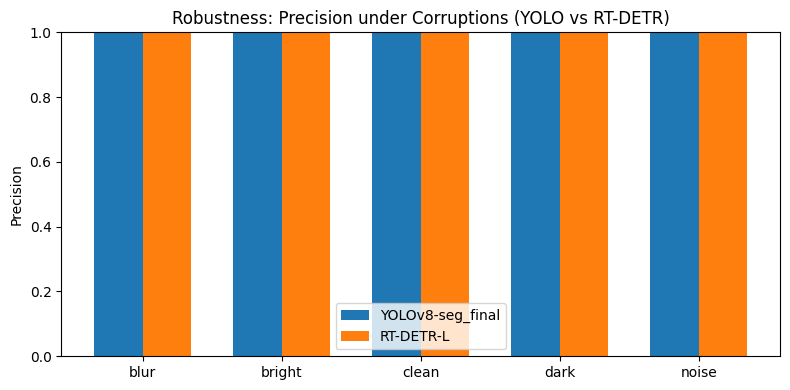

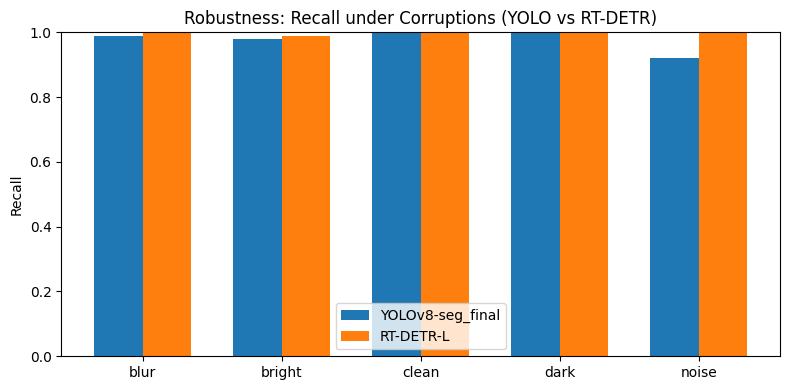

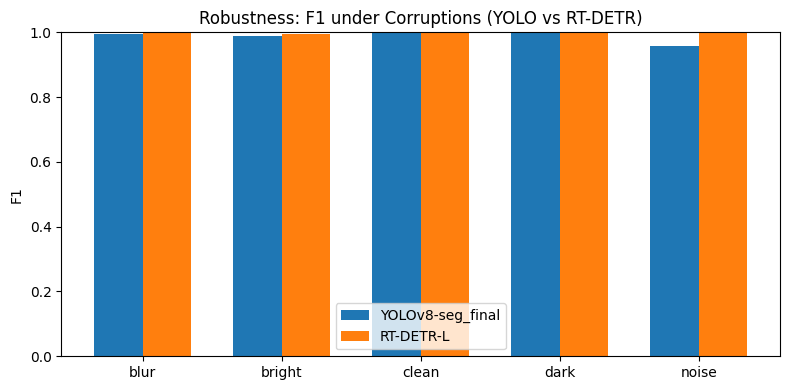

In [ ]:
run_robustness_experiments(
    yolo_model=best_yolo_model,
    rtdetr_model=rtdetr_model,
    dataset_root=DATA_ROOT,
    device="0",
    conf_thresh=0.4,
    iou_thresh=0.45,
    model_names=("YOLOv8-seg_final", "RT-DETR-L"),
)

In [ ]:
def show_robustness_examples(
    yolo_model,
    rtdetr_model,
    dataset_root: Path,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    model_names=("YOLOv8-seg_final", "RT-DETR-L"),
):
    """
    Show qualitative robustness examples for one test image.
    For each corruption condition, we show:
      Top row   : YOLO predictions
      Bottom row: RT-DETR predictions
    """
    print("[INFO] Showing robustness examples (YOLO vs RT-DETR)...")
    test_dir = dataset_root / "test"
    img_files, _ = list_images_labels(test_dir)
    if not img_files:
        print("No validation images found.")
        return

    img_path = random.choice(img_files)
    img = cv2.imread(str(img_path))
    if img is None:
        print("[WARN] Could not read chosen image; skipping robustness examples.")
        return

    corruptions = {
        "clean":  lambda im: im,
        "dark":   apply_dark,
        "bright": apply_bright,
        "blur":   apply_blur,
        "noise":  apply_noise,
    }

    models = [yolo_model, rtdetr_model]
    model_names = list(model_names)

    num_conds = len(corruptions)
    rows = 2   # YOLO row, RT-DETR row
    cols = num_conds

    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
    axes = np.array(axes)
    if rows == 1:
        axes = axes.reshape(1, -1)

    for col, (cond_name, transform) in enumerate(corruptions.items()):
        img_corr = transform(img.copy())

        for row_idx, (model, mname) in enumerate(zip(models, model_names)):
            ax = axes[row_idx, col]

            res = model.predict(
                source=img_corr,
                conf=conf_thresh,
                iou=iou_thresh,
                device=device,
                verbose=False
            )[0]
            annotated = res.plot()
            annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
            ax.imshow(annotated_rgb)
            if row_idx == 0:
                ax.set_title(cond_name)
            ax.set_xlabel(mname)
            ax.axis("off")

    plt.suptitle(f"Robustness comparison on {img_path.name}", fontsize=12)
    plt.tight_layout()
    plt.show()


[INFO] Showing robustness examples (YOLO vs RT-DETR)...


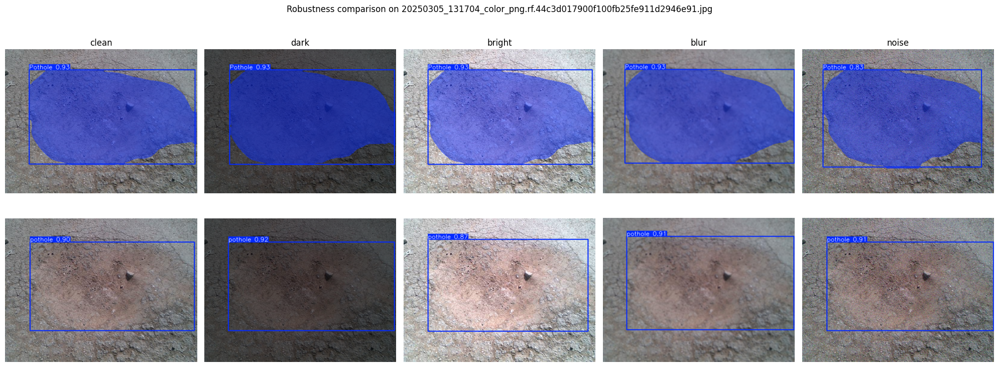

In [ ]:
show_robustness_examples(
    yolo_model=best_yolo_model,
    rtdetr_model=rtdetr_model,
    dataset_root=DATA_ROOT,
    device="0",
    conf_thresh=0.4,
    iou_thresh=0.45,
    model_names=("YOLOv8-seg_final", "RT-DETR-L"),
)


### Classification by Severity / Priority Scoring

In [ ]:
def severity_from_area(area_px: int, img_h: int, img_w: int) -> str:
    total = img_h * img_w
    ratio = area_px / float(total)

    if ratio < 0.005:
        return "Low"
    elif ratio < 0.02:
        return "Medium"
    else:
        return "High"


def compute_severity_distribution(
    model: YOLO,
    dataset_root: Path,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
):
    print("[INFO] Computing severity distribution on test set...")
    test_dir = dataset_root / "test"
    img_files, _ = list_images_labels(test_dir)
    if not img_files:
        print("No validation images found.")
        return

    severity_counts = {"Low": 0, "Medium": 0, "High": 0}
    area_ratios = {"Low": [], "Medium": [], "High": []}

    for img_path in img_files:
        img = cv2.imread(str(img_path))
        if img is None:
            continue
        h, w = img.shape[:2]

        res = model.predict(
            source=img,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )[0]

        if res.masks is None:
            continue

        masks_np = res.masks.data.cpu().numpy()
        for m in masks_np:
            m_bin = (m > 0.5).astype(np.uint8)
            area_px = m_bin.sum()
            sev = severity_from_area(area_px, h, w)
            severity_counts[sev] += 1
            area_ratios[sev].append(area_px / float(h * w))

    print("\n[SEVERITY COUNTS]")
    for k, v in severity_counts.items():
        print(f"  {k}: {v}")

    plt.figure(figsize=(5, 4))
    labels = list(severity_counts.keys())
    values = [severity_counts[k] for k in labels]
    plt.bar(labels, values, color=["green", "orange", "red"])
    plt.ylabel("# Detected Potholes")
    plt.title("Pothole Severity Distribution (Validation)")
    plt.tight_layout()
    plt.show()

    data = [area_ratios["Low"], area_ratios["Medium"], area_ratios["High"]]
    plt.figure(figsize=(5, 4))
    plt.boxplot(data, labels=["Low", "Medium", "High"])
    plt.ylabel("Mask Area Ratio")
    plt.title("Pothole Size Distribution by Severity")
    plt.tight_layout()
    plt.show()


def show_severity_examples(
    model: YOLO,
    dataset_root: Path,
    num_samples: int = 4,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
):
    print("[INFO] Showing severity examples...")
    val_dir = dataset_root / "valid"
    img_files, _ = list_images_labels(val_dir)
    if not img_files:
        print("No validation images found.")
        return

    num_samples = min(num_samples, len(img_files))
    sample_paths = random.sample(img_files, num_samples)

    colors = {
        "Low": (0, 255, 0),
        "Medium": (0, 255, 255),
        "High": (0, 0, 255),
    }

    cols = 2
    rows = int(np.ceil(num_samples / cols))
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 5, rows * 5))
    axes = np.array(axes).reshape(-1)

    for ax, img_path in zip(axes, sample_paths):
        img_bgr = cv2.imread(str(img_path))
        if img_bgr is None:
            ax.axis("off")
            continue
        h, w = img_bgr.shape[:2]

        res = model.predict(
            source=img_bgr,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )[0]

        annotated = res.plot()

        severities = []
        if res.masks is not None:
            masks_np = res.masks.data.cpu().numpy()
            for m in masks_np:
                m_bin = (m > 0.5).astype(np.uint8)
                area_px = m_bin.sum()
                sev = severity_from_area(area_px, h, w)
                severities.append(sev)

        if res.boxes is not None and len(res.boxes) > 0:
            boxes_xyxy = res.boxes.xyxy.cpu().numpy()
            for i, box in enumerate(boxes_xyxy):
                if i >= len(severities):
                    break
                sev = severities[i]
                x1, y1, x2, y2 = box.astype(int)
                color = colors.get(sev, (255, 255, 255))
                cv2.putText(
                    annotated,
                    sev,
                    (x1, max(y1 - 5, 0)),
                    cv2.FONT_HERSHEY_SIMPLEX,
                    0.6,
                    color,
                    2,
                    cv2.LINE_AA,
                )

        annotated_rgb = cv2.cvtColor(annotated, cv2.COLOR_BGR2RGB)
        ax.imshow(annotated_rgb)
        ax.set_title(f"{img_path.name}")
        ax.axis("off")

    for ax in axes[len(sample_paths):]:
        ax.axis("off")

    plt.tight_layout()
    plt.show()

To move beyond just “pothole vs. no pothole,” I added a small severity analysis based on the **area of each predicted mask**. The `severity_from_area(...)` function takes the number of pixels in a pothole mask and normalizes it by the full image area. Based on this ratio, it assigns a categorical severity label: potholes covering less than 0.5% of the image are tagged as **Low**, between 0.5% and 2% as **Medium**, and anything larger as **High**. This gives a coarse but interpretable notion of how big or critical each detected pothole might be.

The `compute_severity_distribution(...)` function applies this logic across the **entire test set**. For each test image, it runs the YOLO model, extracts the predicted masks, converts each mask into a pixel area ratio, and maps it to Low/Medium/High using `severity_from_area`. It then counts how many detections fall into each severity bucket and plots two summaries: (1) a bar chart showing the total number of potholes per severity level, and (2) a boxplot showing the distribution of mask area ratios within each category. Together, these plots summarize how the model “perceives” the overall severity profile of road damage in the test data.

Finally, the `show_severity_examples(...)` helper picks a few sample images from the validation set and overlays the predicted severity labels directly on the detections. For each detected pothole, it computes the mask area ratio, assigns Low/Medium/High, and writes that label above the bounding box in a color-coded fashion (green for Low, yellow for Medium, red for High). These visual examples make it easy to sanity-check whether the severity thresholds look reasonable and whether the labels align with human intuition when inspecting individual images.


[INFO] Computing severity distribution on test set...

[SEVERITY COUNTS]
  Low: 29
  Medium: 38
  High: 114


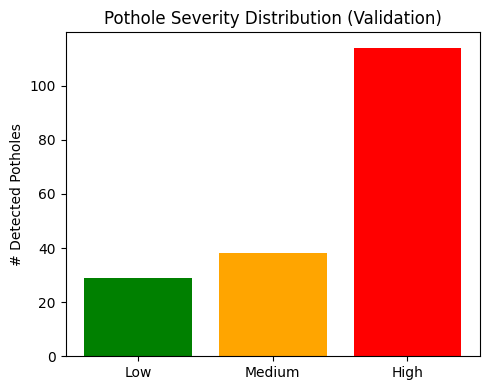

/tmp/ipython-input-1507453576.py:70: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  plt.boxplot(data, labels=["Low", "Medium", "High"])


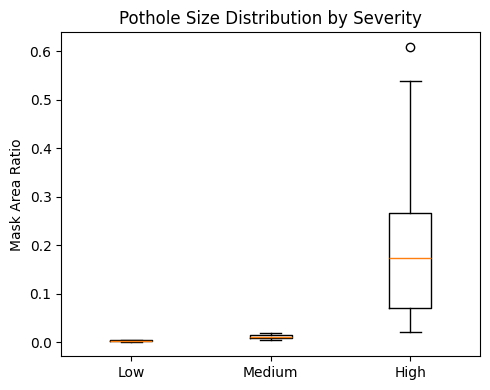

In [ ]:
#Severity / priority scoring (on test)
compute_severity_distribution(best_yolo_model, DATA_ROOT, device="0",
                              conf_thresh=0.4, iou_thresh=0.45)

[INFO] Showing severity examples...


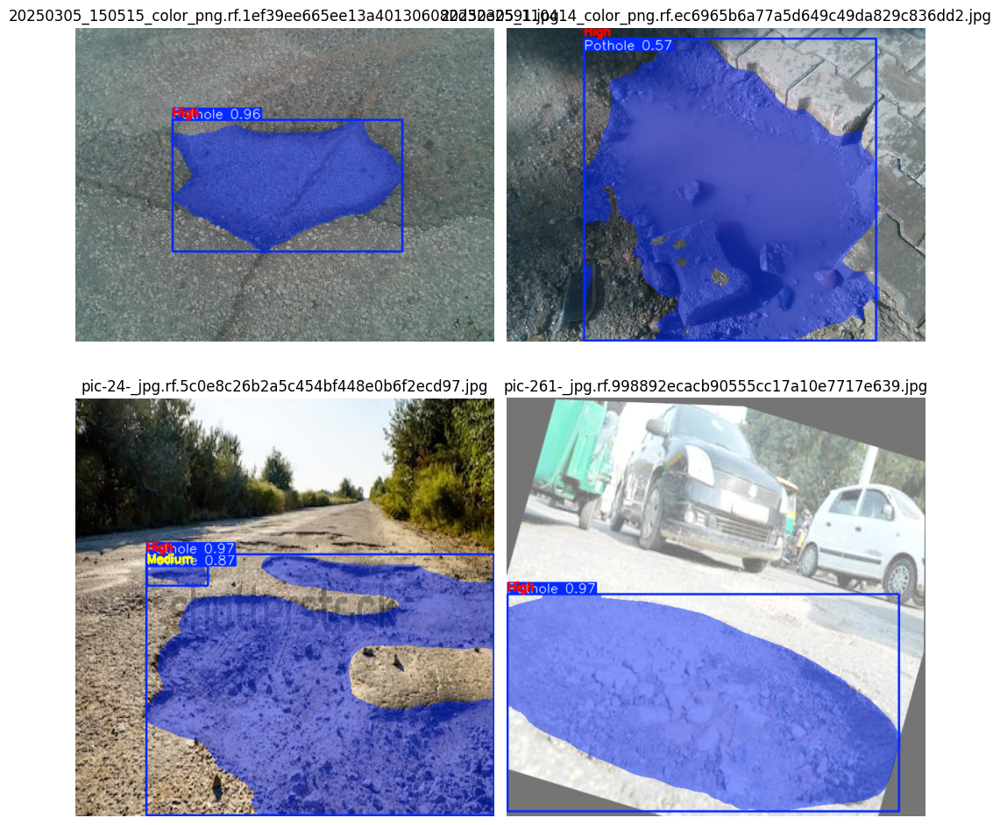

In [ ]:
show_severity_examples(best_yolo_model, DATA_ROOT, num_samples=4, device="0",
                        conf_thresh=0.4, iou_thresh=0.45)

## Evaluating model on video

In the final step, we use the best-performing YOLO and RT-DETR models on a real road video to generate qualitative results. First, we loaded each model's best.pt weights and run full-video inference, letting Ultralytics write out an annotated video with pothole detections overlaid frame by frame. To make the results easier to show in the report, we also call save_detection_frames_from_video, which samples a small set of frames uniformly across the video timeline, runs detection for each frame, and saves the annotated images into separate folders for YOLO (video_frames_yolov8) and RT-DETR (video_frames_rtdetr). If show_samples=True, the notebook displays a small grid of these frames, allowing a side-by-side visual comparison of how both models behave on realistic driving footage.

[INFO] Running BEST model on video: /content/drive/MyDrive/Pothole/dataset/sample_video 2.mp4
[INFO] Loading weights from: /content/drive/MyDrive/Pothole/dataset/pothole_runs/exp_bs16_lr2e3_final_longrun/weights/best.pt
[INFO] Running inference on: /content/drive/MyDrive/Pothole/dataset/sample_video 2.mp4

WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/375) /content/drive/MyDrive/Pothole/dataset/sample_video 2.mp4: 384x640 4 Potholes, 6518.3ms
video 1/1 (frame 2/375) /content/driv

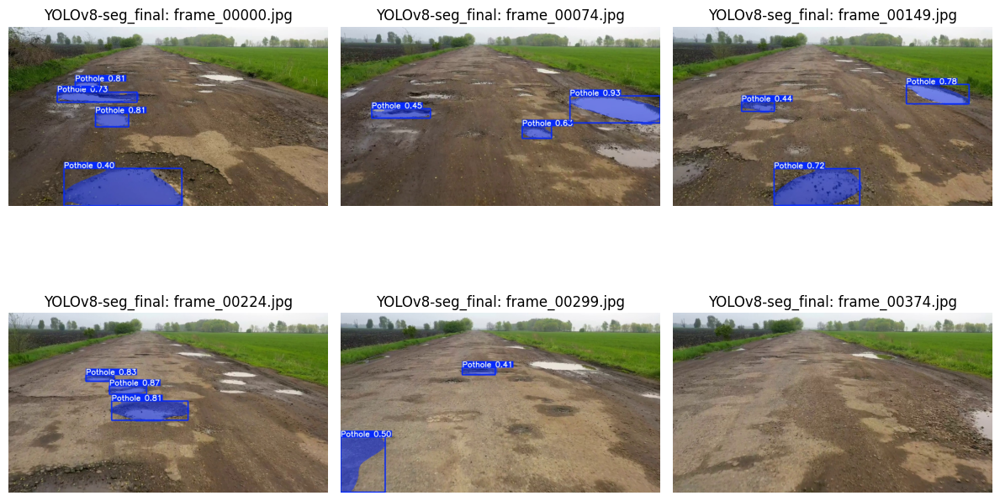

[INFO] Saving 6 detection frames to: /content/drive/MyDrive/Pothole/dataset/pothole_runs/video_frames_rtdetr (RT-DETR-L)
[INFO] Video frame sampling complete.


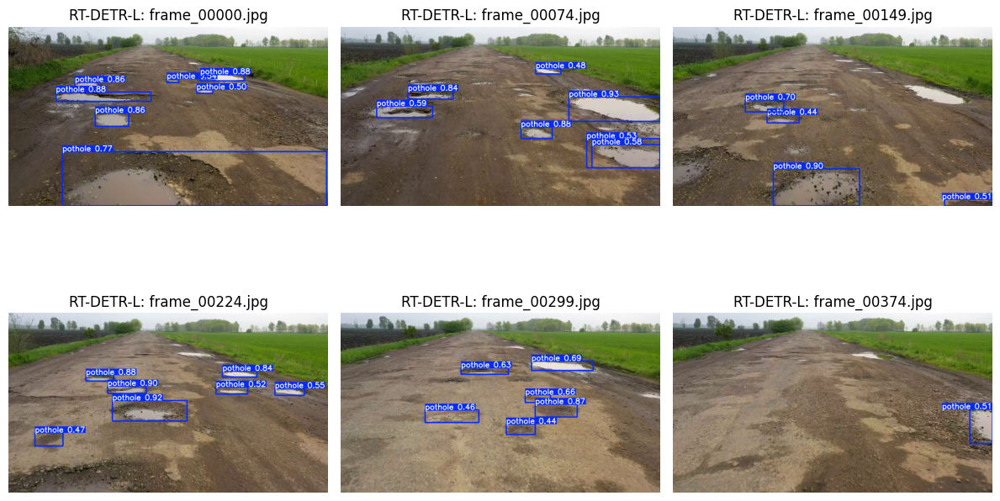

In [ ]:
#Run best model on video + save frame images

def detect_on_source_using_yolo(
    weights_path: Union[str, Path],
    source: Union[str, int],
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    device: str = "0",
    save_output: bool = True,
    show_window: bool = False
):
    print(f"[INFO] Loading weights from: {weights_path}")
    model = YOLO(str(weights_path))

    print(f"[INFO] Running inference on: {source}")
    _ = model.predict(
        source=source,
        conf=conf_thresh,
        iou=iou_thresh,
        device=device,
        save=save_output,
        show=show_window,
        project=str(RUNS_DIRECTORY),
        name="pothole_inference",
        exist_ok=True,
    )
    print("[INFO] Inference complete.")


def detect_on_source_using_rtdert(
    weights_path: Union[str, Path],
    source: Union[str, int],
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    device: str = "0",
    save_output: bool = True,
    show_window: bool = False
):
    print(f"[INFO] Loading weights from: {weights_path}")
    model = RTDETR(str(weights_path))

    print(f"[INFO] Running inference on: {source}")
    _ = model.predict(
        source=source,
        conf=conf_thresh,
        iou=iou_thresh,
        device=device,
        save=save_output,
        show=show_window,
        project=str(RUNS_DIRECTORY),
        name="pothole_inference",
        exist_ok=True,
    )
    print("[INFO] Inference complete.")


def save_detection_frames_from_video(
    model,
    video_path: Union[str, Path],
    out_dir: Path,
    num_frames: int = 6,
    device: str = "0",
    conf_thresh: float = 0.4,
    iou_thresh: float = 0.45,
    show_samples: bool = False,
    model_name: str = "Model",
):
    """
    Sample a few frames from a video, run detection, and save annotated frames.
    Useful for documentation.
    """
    video_path = str(video_path)
    ensure_directory(out_dir)

    cap = cv2.VideoCapture(video_path)
    if not cap.isOpened():
        print(f"[WARN] Could not open video: {video_path}")
        return

    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    if total_frames <= 0:
        print("[WARN] Video has no frames; skipping frame sampling.")
        cap.release()
        return

    frame_indices = np.linspace(0, total_frames - 1, num_frames, dtype=int)

    print(f"[INFO] Saving {len(frame_indices)} detection frames to: {out_dir} ({model_name})")

    saved_paths = []

    for idx in frame_indices:
        cap.set(cv2.CAP_PROP_POS_FRAMES, int(idx))
        ret, frame = cap.read()
        if not ret:
            continue

        res = model.predict(
            source=frame,
            conf=conf_thresh,
            iou=iou_thresh,
            device=device,
            verbose=False
        )[0]
        annotated = res.plot()  # BGR
        out_path = out_dir / f"frame_{idx:05d}.jpg"
        cv2.imwrite(str(out_path), annotated)
        saved_paths.append(out_path)

    cap.release()
    print("[INFO] Video frame sampling complete.")

    if show_samples and saved_paths:
        cols = min(len(saved_paths), 3)
        rows = int(np.ceil(len(saved_paths) / cols))
        fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
        axes = np.array(axes).reshape(-1)

        for ax, p in zip(axes, saved_paths):
            img = cv2.imread(str(p))
            if img is None:
                ax.axis("off")
                continue
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            ax.imshow(img_rgb)
            ax.set_title(f"{model_name}: {p.name}")
            ax.axis("off")

        for ax in axes[len(saved_paths):]:
            ax.axis("off")

        plt.tight_layout()
        plt.show()

if os.path.exists(VIDEO_INPUT_PATH):
    print(f"[INFO] Running BEST model on video: {VIDEO_INPUT_PATH}")
    detect_on_source_using_yolo(
        weights_path=final_yolo_run_dir / "weights" / "best.pt",
        source=VIDEO_INPUT_PATH,
        conf_thresh=0.4,
        iou_thresh=0.45,
        device="0",
        save_output=True,
        show_window=False,
    )

    detect_on_source_using_yolo(
        weights_path=rtdetr_run_dir / "weights" / "best.pt",
        source=VIDEO_INPUT_PATH,
        conf_thresh=0.4,
        iou_thresh=0.45,
        device="0",
        save_output=True,
        show_window=False,
    )

    # YOLOv8-seg_final: save + show frames
    save_detection_frames_from_video(
        model=best_yolo_model,
        video_path=VIDEO_INPUT_PATH,
        out_dir=RUNS_DIRECTORY / "video_frames_yolov8",
        num_frames=6,
        device="0",
        conf_thresh=0.4,
        iou_thresh=0.45,
        show_samples=True,
        model_name="YOLOv8-seg_final",
    )

    # RT-DETR-L: save + show frames
    save_detection_frames_from_video(
        model=rtdetr_model,
        video_path=VIDEO_INPUT_PATH,
        out_dir=RUNS_DIRECTORY / "video_frames_rtdetr",
        num_frames=6,
        device="0",
        conf_thresh=0.4,
        iou_thresh=0.45,
        show_samples=True,
        model_name="RT-DETR-L",
    )
else:
    print(f"[WARN] Video not found at {VIDEO_INPUT_PATH}; skipping video inference & frame sampling.")

